In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

plt.rcParams["figure.figsize"] = (10,6)

sns.set_style("whitegrid")
pd.set_option('display.float_format', lambda x: '%.3f' % x)

# Set it None to display all rows in the dataframe
# pd.set_option('display.max_rows', None)

# Set it to None to display all columns in the dataframe
pd.set_option('display.max_columns', None)

In [2]:
!pip install folium 

In [3]:
df = pd.read_csv("kc_house_data.csv")

## Exploratory Data Analysis and Visualization

In [4]:
df.head(10)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650
1,6414100192,12/9/2014,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639
2,5631500400,2/25/2015,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062
3,2487200875,12/9/2014,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000
4,1954400510,2/18/2015,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503
5,7237550310,5/12/2014,1230000.000,4,4.500,5420,101930,1.000,0,0,3,11,3890,1530,2001,0,98053,47.656,-122.005,4760,101930
6,1321400060,6/27/2014,257500.000,3,2.250,1715,6819,2.000,0,0,3,7,1715,0,1995,0,98003,47.310,-122.327,2238,6819
7,2008000270,1/15/2015,291850.000,3,1.500,1060,9711,1.000,0,0,3,7,1060,0,1963,0,98198,47.410,-122.315,1650,9711
8,2414600126,4/15/2015,229500.000,3,1.000,1780,7470,1.000,0,0,3,7,1050,730,1960,0,98146,47.512,-122.337,1780,8113
9,3793500160,3/12/2015,323000.000,3,2.500,1890,6560,2.000,0,0,3,7,1890,0,2003,0,98038,47.368,-122.031,2390,7570


Information about the Kaggle data set (House Sales):

https://www.kaggle.com/harlfoxem/housesalesprediction

#### Feature Columns
    
* id - Unique ID for each home sold
* date - Date of the home sale
* price - Price of each home sold
* bedrooms - Number of bedrooms
* bathrooms - Number of bathrooms, where .5 accounts for a room with a toilet but no shower
* sqft_living - Square footage of the apartments interior living space
* sqft_lot - Square footage of the land space
* floors - Number of floors
* waterfront - A dummy variable for whether the apartment was overlooking the waterfront or not
* view - An index from 0 to 4 of how good the view of the property was
* condition - An index from 1 to 5 on the condition of the apartment,
* grade - An index from 1 to 13, where 1-3 falls short of building construction and design, 7 has an average level of construction and design, and 11-13 have a high quality level of construction and design.
* sqft_above - The square footage of the interior housing space that is above ground level
* sqft_basement - The square footage of the interior housing space that is below ground level
* yr_built - The year the house was initially built
* yr_renovated - The year of the house’s last renovation
* zipcode - What zipcode area the house is in
* lat - Lattitude
* long - Longitude
* sqft_living15 - The square footage of interior housing living space for the nearest 15 neighbors
* sqft_lot15 - The square footage of the land lots of the nearest 15 neighbors

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     21597 non-null  int64  
 9   view           21597 non-null  int64  
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  int64  
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   21597 non-null  int64  
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

In [6]:
df.isnull().sum().any()

False

In [7]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
id,21597.000,4580474287.771,2876735715.748,1000102.000,2123049175.000,3904930410.000,7308900490.000,9900000190.000
price,21597.000,540296.574,367368.140,78000.000,322000.000,450000.000,645000.000,7700000.000
bedrooms,21597.000,3.373,0.926,1.000,3.000,3.000,4.000,33.000
bathrooms,21597.000,2.116,0.769,0.500,1.750,2.250,2.500,8.000
sqft_living,21597.000,2080.322,918.106,370.000,1430.000,1910.000,2550.000,13540.000
sqft_lot,21597.000,15099.409,41412.637,520.000,5040.000,7618.000,10685.000,1651359.000
floors,21597.000,1.494,0.540,1.000,1.000,1.500,2.000,3.500
waterfront,21597.000,0.008,0.087,0.000,0.000,0.000,0.000,1.000
view,21597.000,0.234,0.766,0.000,0.000,0.000,0.000,4.000
condition,21597.000,3.410,0.651,1.000,3.000,3.000,4.000,5.000


### id_number

In [8]:
# We drop 'id' from dataset.

df = df.drop('id', axis = 1)

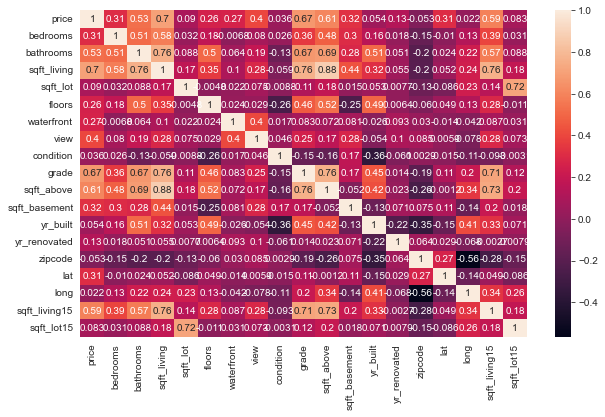

In [9]:
# The correlations between the features.

sns.heatmap(df.corr(), annot = True);

### Price

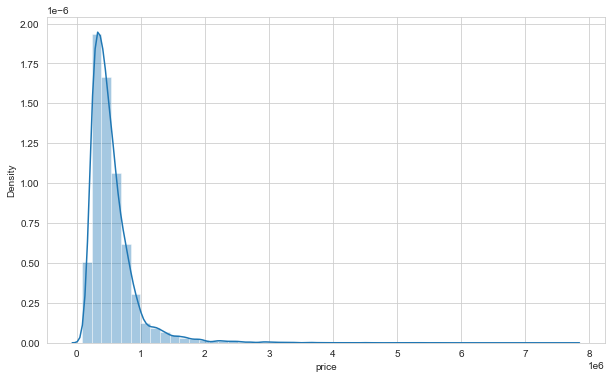

In [10]:
# Plot of 'Density' vs. 'Price'

sns.distplot(df['price']);

In [11]:
# It makes sense to drop prices higher than $3000000.

df[df["price"] > 3000000].sort_values(by="price", ascending=False)

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
7245,10/13/2014,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,1910,1987,98102,47.630,-122.323,3940,8800
3910,6/11/2014,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,1940,2001,98004,47.650,-122.214,3930,25449
9245,9/19/2014,6890000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,2001,0,98039,47.630,-122.240,4540,42730
4407,8/4/2014,5570000.000,5,5.750,9200,35069,2.000,0,0,3,13,6200,3000,2001,0,98039,47.629,-122.233,3560,24345
1446,4/13/2015,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,2009,0,98004,47.623,-122.220,4600,21750
1313,4/13/2015,5300000.000,6,6.000,7390,24829,2.000,1,4,4,12,5000,2390,1991,0,98040,47.563,-122.210,4320,24619
1162,10/20/2014,5110000.000,5,5.250,8010,45517,2.000,1,4,3,12,5990,2020,1999,0,98033,47.677,-122.211,3430,26788
8085,6/17/2014,4670000.000,5,6.750,9640,13068,1.000,1,4,3,12,4820,4820,1983,2009,98040,47.557,-122.210,3270,10454
2624,8/15/2014,4500000.000,5,5.500,6640,40014,2.000,1,4,3,12,6350,290,2004,0,98155,47.749,-122.280,3030,23408
8629,6/18/2014,4490000.000,4,3.000,6430,27517,2.000,0,0,3,12,6430,0,2001,0,98004,47.621,-122.219,3720,14592


In [12]:
# We check the details of 'waterfront' flats.

df.groupby("waterfront").mean().T

waterfront,0,1
price,531762.324,1662524.184
bedrooms,3.374,3.301
bathrooms,2.112,2.678
sqft_living,2072.007,3173.687
sqft_lot,15021.290,25371.828
floors,1.493,1.641
view,0.207,3.767
condition,3.409,3.534
grade,7.649,8.773
sqft_above,1783.392,2473.043


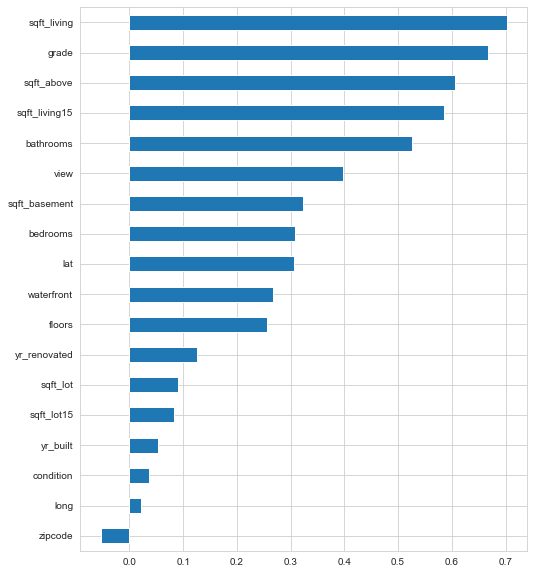

In [13]:
# We see the correlations with 'Price' using 'bar plot'.

plt.figure(figsize = (8,10))
df.corr()["price"].sort_values().drop("price").plot(kind = "barh");

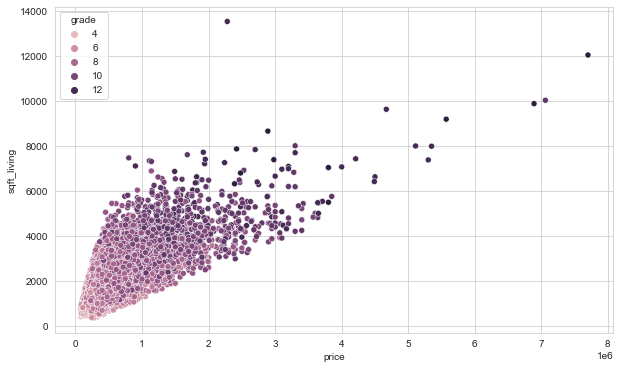

In [14]:
# The effect of 'sqft_living' on 'price' as a function of 'grade'.

sns.scatterplot(x = 'price',y = 'sqft_living', data = df, hue = "grade");

### Bedrooms

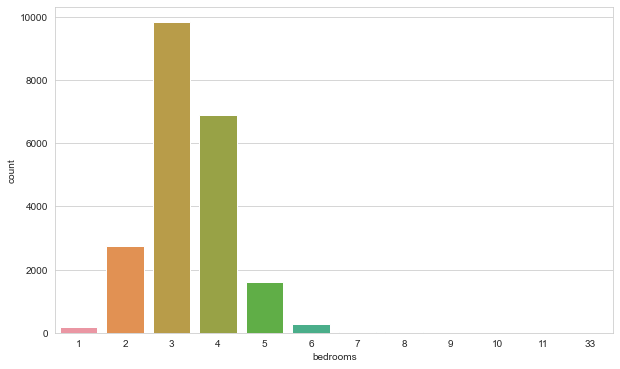

In [15]:
# Number of bedrooms

sns.countplot(df['bedrooms']);

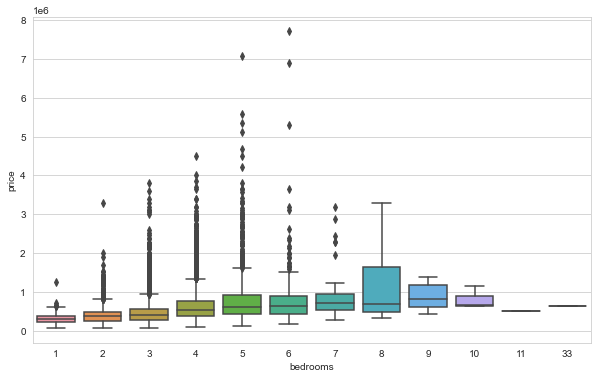

In [16]:
sns.boxplot(x = 'bedrooms', y = 'price', data = df);

In [17]:
# The list of flats with bedroom > 10.

df[df["bedrooms"] > 10]

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
8748,8/21/2014,520000.000,11,3.000,3000,4960,2.000,0,0,3,7,2400,600,1918,1999,98106,47.556,-122.363,1420,4960
15856,6/25/2014,640000.000,33,1.750,1620,6000,1.000,0,0,5,7,1040,580,1947,0,98103,47.688,-122.331,1330,4700


In [18]:
df = df[df["bedrooms"] != 33]

Most likely the data was entered incorrectly.

In [19]:
# The new shape of df.

df.shape

(21596, 20)

### Date

In [20]:
df['date'].dtype

dtype('O')

In [21]:
# We convert datatype 'O' to 'datetime' format.

df['date'] = pd.to_datetime(df['date'])

In [22]:
df['date']

0       2014-10-13
1       2014-12-09
2       2015-02-25
3       2014-12-09
4       2015-02-18
           ...    
21592   2014-05-21
21593   2015-02-23
21594   2014-06-23
21595   2015-01-16
21596   2014-10-15
Name: date, Length: 21596, dtype: datetime64[ns]

In [23]:
# We add a new 'year' column using 'date' feature.

df['year'] = df['date'].dt.year

In [24]:
# We add a new 'month' column using 'date' feature.

df['month'] = df['date'].dt.month

In [25]:
# Checking the latest version of df.

df.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month
0,2014-10-13,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650,2014,10
1,2014-12-09,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639,2014,12
2,2015-02-25,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062,2015,2
3,2014-12-09,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000,2014,12
4,2015-02-18,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503,2015,2


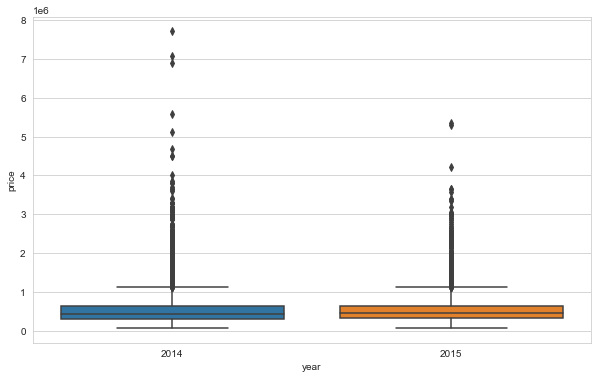

In [26]:
sns.boxplot(x = 'year', y = 'price', data = df);

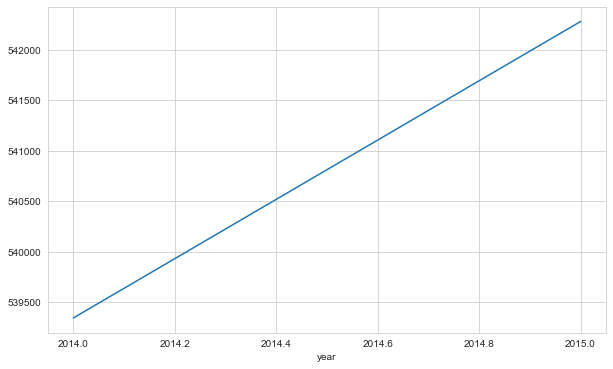

In [27]:
# How did the prices change in years?

df.groupby('year')['price'].mean().plot();

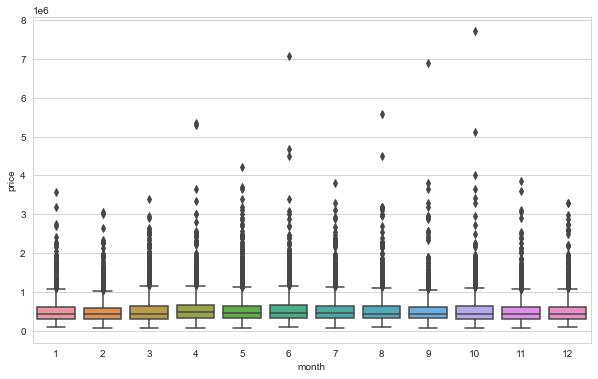

In [28]:
# How did the prices change in months?

sns.boxplot(x = 'month', y = 'price', data = df);

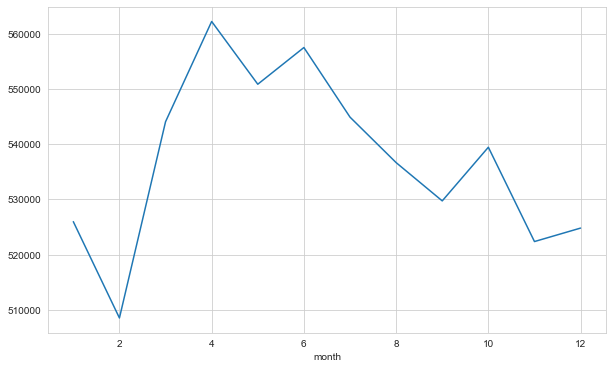

In [29]:
# Plotting mean prices as a function of months.

df.groupby('month')['price'].mean().plot();

In [30]:
# We add new columns with prefix 'month'.
# It makes sense to analyze df as a function of months, not years.

month_dummy = pd.get_dummies(df["month"], prefix = "month")
df = pd.concat([df, month_dummy], axis = 1)
df.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
0,2014-10-13,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650,2014,10,0,0,0,0,0,0,0,0,0,1,0,0
1,2014-12-09,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639,2014,12,0,0,0,0,0,0,0,0,0,0,0,1
2,2015-02-25,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062,2015,2,0,1,0,0,0,0,0,0,0,0,0,0
3,2014-12-09,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000,2014,12,0,0,0,0,0,0,0,0,0,0,0,1
4,2015-02-18,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503,2015,2,0,1,0,0,0,0,0,0,0,0,0,0


In [31]:
# After adding new columns, we drop 'date', 'year' and 'month' columns.

df = df.drop(['date', "year", "month"], axis = 1)

### zipcode

In [32]:
df['zipcode'].value_counts(dropna = False)

98103    601
98038    589
98115    583
98052    574
98117    553
        ... 
98102    104
98010    100
98024     80
98148     57
98039     50
Name: zipcode, Length: 70, dtype: int64

We can categorize the zipcodes as north, south, west, east, middle by regions. But this can be made manually and will take many time. Additionally, we need domain knowledge to do that. In short, we will drop this column.

In [33]:
df = df.drop('zipcode', axis = 1)

### yr_renovated & yr_built

In [34]:
df['yr_renovated'].value_counts(dropna = False)

0       20682
2014       91
2013       37
2003       36
2005       35
        ...  
1951        1
1959        1
1948        1
1954        1
1944        1
Name: yr_renovated, Length: 70, dtype: int64

In [35]:
df['yr_built'].value_counts(dropna = False)

2014    559
2006    453
2005    450
2004    433
2003    420
       ... 
1933     30
1901     29
1902     27
1935     24
1934     21
Name: yr_built, Length: 116, dtype: int64

Could make sense due to scaling, higher should correlate to more value.

### sqft_basement

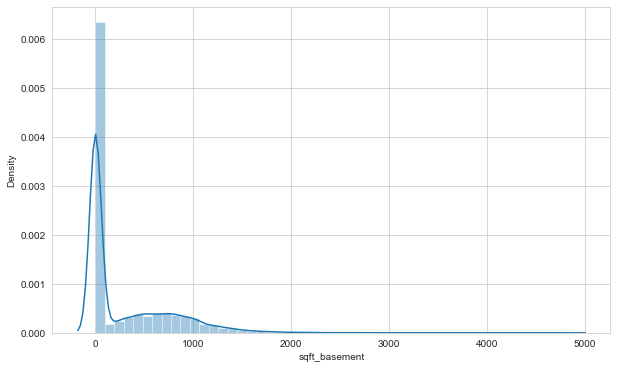

In [36]:
sns.distplot(df['sqft_basement']);

In [37]:
df['sqft_basement'].value_counts(dropna = False)

0      13110
600      221
700      218
500      214
800      206
       ...  
518        1
374        1
784        1
906        1
248        1
Name: sqft_basement, Length: 306, dtype: int64

In [38]:
df[df["sqft_basement"] > 3000].sort_values(by="sqft_basement", ascending=False)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
8085,4670000.000,5,6.750,9640,13068,1.000,1,4,3,12,4820,4820,1983,2009,47.557,-122.210,3270,10454,0,0,0,0,0,1,0,0,0,0,0,0
12764,2280000.000,7,8.000,13540,307752,3.000,0,4,3,12,9410,4130,1999,0,47.667,-121.986,4850,217800,0,0,0,0,1,0,0,0,0,0,0,0
15468,3200000.000,4,3.250,7000,28206,1.000,1,4,4,12,3500,3500,1991,0,47.593,-122.086,4913,14663,0,0,0,0,0,0,0,1,0,0,0,0
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,1910,1987,47.630,-122.323,3940,8800,0,0,0,0,0,0,0,0,0,1,0,0
10074,1900000.000,5,4.250,6510,16471,2.000,0,3,4,11,3250,3260,1980,0,47.576,-122.242,4480,16471,0,0,0,0,0,0,0,0,1,0,0,0


Could make sense due to scaling, higher should correlate to more value.

### sqft_above

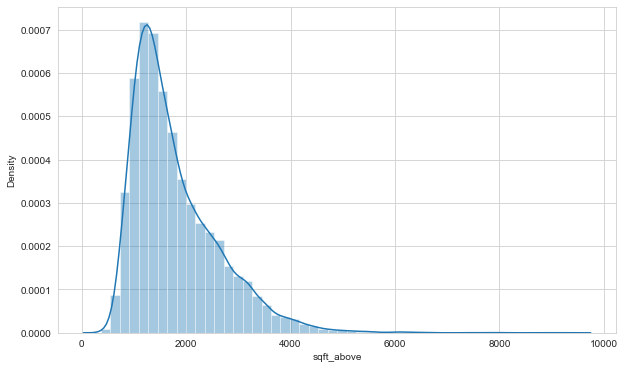

In [39]:
sns.distplot(df['sqft_above']);

In [40]:
df['sqft_above'].value_counts(dropna = False)

1300    212
1010    210
1200    206
1220    192
1140    184
       ... 
3674      1
2979      1
2382      1
6290      1
1425      1
Name: sqft_above, Length: 942, dtype: int64

In [41]:
df[df["sqft_above"] > 6000].sort_values(by="sqft_above", ascending=False)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
12764,2280000.000,7,8.000,13540,307752,3.000,0,4,3,12,9410,4130,1999,0,47.667,-121.986,4850,217800,0,0,0,0,1,0,0,0,0,0,0,0
9245,6890000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,2001,0,47.630,-122.240,4540,42730,0,0,0,0,0,0,0,0,1,0,0,0
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,1910,1987,47.630,-122.323,3940,8800,0,0,0,0,0,0,0,0,0,1,0,0
18288,3300000.000,5,6.250,8020,21738,2.000,0,0,3,11,8020,0,2001,0,47.568,-122.189,4160,18969,0,0,0,0,0,0,1,0,0,0,0,0
13398,2420000.000,5,4.750,7880,24250,2.000,0,2,3,13,7880,0,1996,0,47.733,-122.362,2740,10761,1,0,0,0,0,0,0,0,0,0,0,0
19842,2700000.000,4,4.000,7850,89651,2.000,0,0,3,12,7850,0,2006,0,47.541,-121.982,6210,95832,1,0,0,0,0,0,0,0,0,0,0,0
3910,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,1940,2001,47.650,-122.214,3930,25449,0,0,0,0,0,1,0,0,0,0,0,0
11859,1950000.000,4,3.250,7420,167869,2.000,0,3,3,12,7420,0,2002,0,47.455,-121.764,5610,169549,1,0,0,0,0,0,0,0,0,0,0,0
18579,1140000.000,5,4.000,7320,217800,2.000,0,0,3,11,7320,0,1992,0,47.447,-122.086,3270,34500,0,0,0,0,0,0,1,0,0,0,0,0
1446,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,2009,0,47.623,-122.220,4600,21750,0,0,0,1,0,0,0,0,0,0,0,0


### Geographical Properties

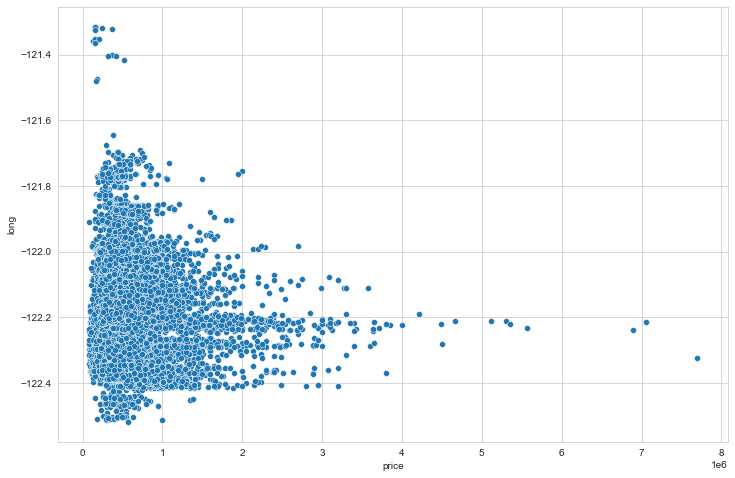

In [42]:
plt.figure(figsize = (12, 8))
sns.scatterplot(x = 'price', y = 'long', data = df);

Flats with -122.2 longtitude are expensive than the others.

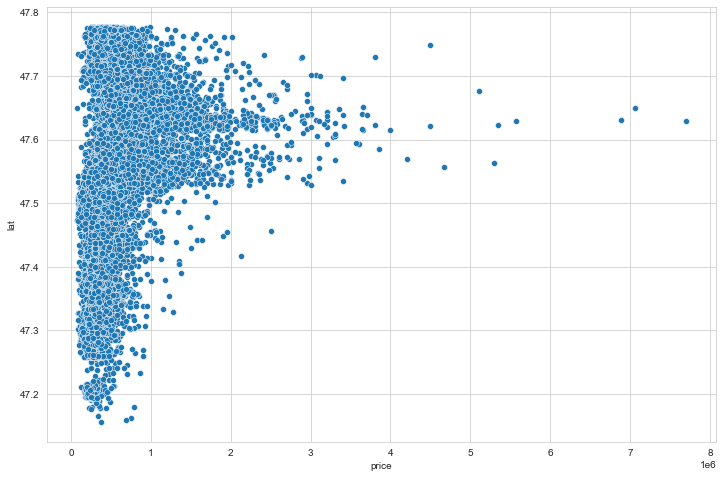

In [43]:
plt.figure(figsize  = (12, 8))
sns.scatterplot(x = 'price', y = 'lat', data = df);

Flats with ~47.6 latitude are expensive than the others.

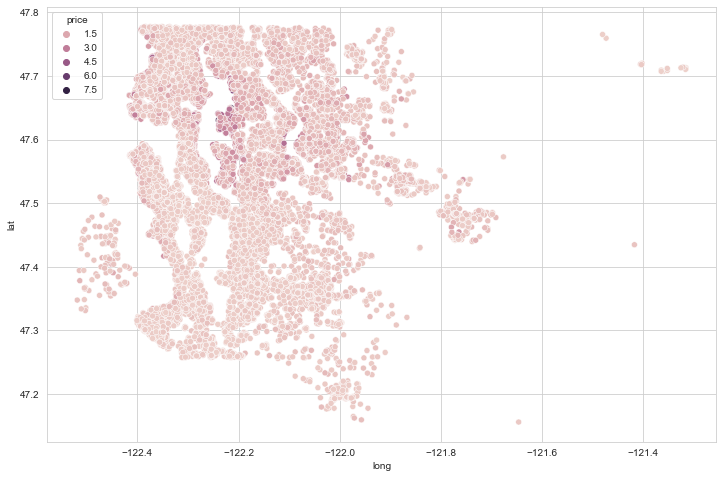

In [44]:
# Now it is time to see the coordinates of the region of expensive flats.

plt.figure(figsize = (12, 8))
sns.scatterplot(x = 'long', y = 'lat', data = df, hue = 'price');

from uszipcode import SearchEngine

search = SearchEngine()

df['zipcode'].apply(lambda x: search.by_zipcode(x).major_city)

In [45]:
# We check the number of rows.

len(df) * (0.01)

215.96

In [46]:
# We list only %10 of the rows in df.

df.sort_values('price', ascending = False).head(216)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,1910,1987,47.630,-122.323,3940,8800,0,0,0,0,0,0,0,0,0,1,0,0
3910,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,1940,2001,47.650,-122.214,3930,25449,0,0,0,0,0,1,0,0,0,0,0,0
9245,6890000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,2001,0,47.630,-122.240,4540,42730,0,0,0,0,0,0,0,0,1,0,0,0
4407,5570000.000,5,5.750,9200,35069,2.000,0,0,3,13,6200,3000,2001,0,47.629,-122.233,3560,24345,0,0,0,0,0,0,0,1,0,0,0,0
1446,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,2009,0,47.623,-122.220,4600,21750,0,0,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7408,1980000.000,6,4.500,4800,9097,2.000,0,0,3,10,3580,1220,2007,0,47.626,-122.291,2180,6037,0,0,0,0,0,0,1,0,0,0,0,0
16511,1980000.000,4,3.500,4500,44384,1.000,0,0,3,12,3340,1160,1990,0,47.632,-122.192,2540,26287,0,1,0,0,0,0,0,0,0,0,0,0
19513,1980000.000,4,4.000,4360,12081,2.000,0,0,3,10,4360,0,2007,0,47.638,-122.219,2180,10800,0,0,0,0,0,0,0,1,0,0,0,0
3278,1970000.000,5,3.750,3940,13738,1.500,0,3,4,9,3940,0,1951,0,47.620,-122.212,2370,13320,0,1,0,0,0,0,0,0,0,0,0,0


In [47]:
# We form a datafra

non_top_1_perc = df.sort_values('price', ascending = False).iloc[216:]

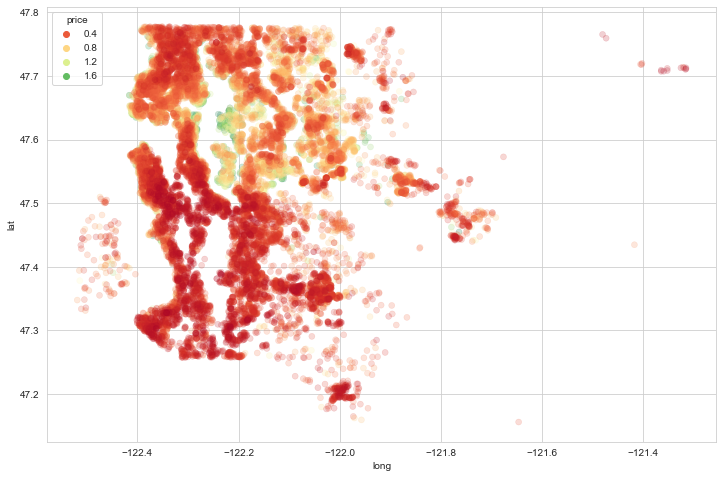

In [48]:
plt.figure(figsize = (12, 8))
sns.scatterplot(x = 'long', y = 'lat', data = non_top_1_perc, hue = 'price',
                palette = 'RdYlGn', edgecolor = None, alpha = 0.2);

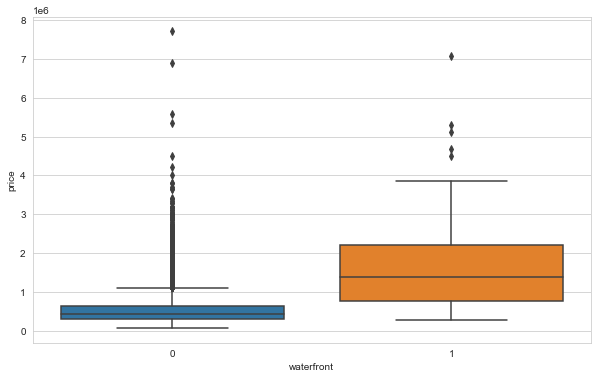

In [49]:
sns.boxplot(x = 'waterfront', y = 'price', data = df);

In [50]:
pip install folium

Note: you may need to restart the kernel to use updated packages.


In [51]:
import folium
import branca.colormap as cm

In [52]:
folium.Map(location=[df["lat"].mean(), df["long"].mean()], zoom_start=10)

In [53]:
step_1 = df.price.min()
step_2 = df.price.quantile(0.25)
step_3 = df.price.quantile(0.50)
step_4 = df.price.quantile(0.75)
step_5 = df.price.max()

In [54]:
m = folium.Map(location=[df["lat"].mean(), df["long"].mean()], zoom_start = 10)
colormap = cm.StepColormap(colors=["green","yellow","orange","red"] ,
                           index=[step_1, step_2, step_3, step_4, step_5],
                           vmin=step_1,
                           vmax=step_5)
for loc, p in zip(zip(df['lat'], df['long']),df["price"]):
      folium.Circle(
      location=loc,
      radius=1, #yarıçap
      fill=True, 
      color=colormap(p)
      ).add_to(m)
m

### latest data

In [55]:
df.head(10)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
0,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,47.511,-122.257,1340,5650,0,0,0,0,0,0,0,0,0,1,0,0
1,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,47.721,-122.319,1690,7639,0,0,0,0,0,0,0,0,0,0,0,1
2,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,47.738,-122.233,2720,8062,0,1,0,0,0,0,0,0,0,0,0,0
3,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,47.521,-122.393,1360,5000,0,0,0,0,0,0,0,0,0,0,0,1
4,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,47.617,-122.045,1800,7503,0,1,0,0,0,0,0,0,0,0,0,0
5,1230000.000,4,4.500,5420,101930,1.000,0,0,3,11,3890,1530,2001,0,47.656,-122.005,4760,101930,0,0,0,0,1,0,0,0,0,0,0,0
6,257500.000,3,2.250,1715,6819,2.000,0,0,3,7,1715,0,1995,0,47.310,-122.327,2238,6819,0,0,0,0,0,1,0,0,0,0,0,0
7,291850.000,3,1.500,1060,9711,1.000,0,0,3,7,1060,0,1963,0,47.410,-122.315,1650,9711,1,0,0,0,0,0,0,0,0,0,0,0
8,229500.000,3,1.000,1780,7470,1.000,0,0,3,7,1050,730,1960,0,47.512,-122.337,1780,8113,0,0,0,1,0,0,0,0,0,0,0,0
9,323000.000,3,2.500,1890,6560,2.000,0,0,3,7,1890,0,2003,0,47.368,-122.031,2390,7570,0,0,1,0,0,0,0,0,0,0,0,0


In [56]:
df.shape

(21596, 30)

## Preprocessing of Data
- Train | Test Split, Scalling

In [59]:
from sklearn.model_selection import train_test_split 

# We have completed EDA and now are ready to set our model.

In [60]:
X = df.drop('price', axis = 1)
y = df['price'] # target variable = price 

In [61]:
seed = 101 # seed değerini 101 belirledik. 
# aşağıda bunu kullanıp datamızı herbirimiz için aynı değerlere sahip olacak şekilde böldük.
# ama bu bize aynı sonuçları alabileceğimiz göstermiyor.
# çünkü DL nin kendi içindeki randomization durumları ağırlıklandırmayı değiştirebilir.

In [62]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=seed) 

# % 10 is set for test size.

In [65]:
from sklearn.preprocessing import MinMaxScaler  

# If there are too many outliers in the dataset, then robust scaler should be used, otherwise minmax can be used.
# We do not have too many outliers, we go with MinMaxScaler().

In [66]:
scaler = MinMaxScaler()

In [68]:
X_train = scaler.fit_transform(X_train) 
X_test  = scaler.transform(X_test)

## Modelling & Model Performance

In [69]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation   

# Relevant libraries are imported.

In [70]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, explained_variance_score, r2_score 

# metrics are used for evaluation of the results to be obtained.

In [71]:
def eval_metric(actual, pred):
    mae = mean_absolute_error(actual, pred) # mean absolute error
    mse = mean_squared_error(actual, pred)  # mean squared error
    rmse = np.sqrt(mean_squared_error(actual, pred)) # root mean squared error
    score = r2_score(actual, pred)
    return print("r2_score:", score, "\nmae:", mae, "\nmse:", mse, "\nrmse:", rmse)

In [72]:
X_train.shape 

(19436, 29)

In [73]:
tf.random.set_seed(seed) # we set as 101.

model = Sequential()    

model.add(Dense(29, activation = 'relu')) # Activation function can be added separately as a different line after each layer. 
model.add(Dense(15, activation = 'relu')) # 'relu' is set as activation function.
model.add(Dense(29, activation = 'relu'))
model.add(Dense(8, activation = 'relu'))
model.add(Dense(1)) # We do need to specify activation function. Because neuron number is 1 which indicates 'linear'. 

# Here is the explanation for this. 

"""units: Positive integer, dimensionality of the output space.
  activation: Activation function to use.
    If you don't specify anything, no activation is applied
    (ie. "linear" activation: `a(x) = x`).
  use_bias: Boolean, whether the layer uses a bias vector.
  kernel_initializer: Initializer for the `kernel` weights matrix.
  bias_initializer: Initializer for the bias vector.
  kernel_regularizer: Regularizer function applied to
    the `kernel` weights matrix.
  bias_regularizer: Regularizer function applied to the bias vector.
  activity_regularizer: Regularizer function applied to
    the output of the layer (its "activation").
  kernel_constraint: Constraint function applied to
    the `kernel` weights matrix.
  bias_constraint: Constraint function applied to the bias vector."""


model.compile(optimizer = 'adam', loss = 'mse')

In [74]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000) 

# burda validation split yaparak train datasının yüzde 15 lik kısmını test için ayırdık.
# burda her seferinde bu %15 lik validation split kismini random olarak belirliyor.
# böylece trainin % 85lik kısmını kullanıyor. kendisi bir çıktı vermeden önce her batch kendini test edip öyle çıktı veriyor. 
# böylece çift dikiş gibi çalışıyor. kendi içinde işlemin doğruluğunu kontrol ediyor. 
# batch size'ı 128 belirledik. bu şekilde her seferinde 128 li batcler halinde 1000 defa git gel yapacak.
#_train shape 19436 idi, bunun %85 ni kullandık. yani 16520.6 sını kullandık ve bunu 128 e böldük ve bu da 129.06 a geldi.
# yani 130 iterasyon oluştu. her bir epoch'da böylece 128 batch ile 130 iterasyonla 1000 epoch olacak.
# val_loss ve loss değeri ne kadar düşerse bizim için o kadar iyi.

Epoch 1/1000
130/130 [==============================] - 1s 3ms/step - loss: 428601540608.0000 - val_loss: 423920762880.0000
Epoch 2/1000
130/130 [==============================] - 0s 2ms/step - loss: 426882662400.0000 - val_loss: 417885388800.0000
Epoch 3/1000
130/130 [==============================] - 0s 2ms/step - loss: 402847498240.0000 - val_loss: 364217008128.0000
Epoch 4/1000
130/130 [==============================] - 0s 2ms/step - loss: 295526957056.0000 - val_loss: 207172616192.0000
Epoch 5/1000
130/130 [==============================] - 0s 2ms/step - loss: 139978424320.0000 - val_loss: 108233293824.0000
Epoch 6/1000
130/130 [==============================] - 0s 2ms/step - loss: 98616713216.0000 - val_loss: 104425881600.0000
Epoch 7/1000
130/130 [==============================] - 0s 2ms/step - loss: 96298213376.0000 - val_loss: 102923018240.0000
Epoch 8/1000
130/130 [==============================] - 0s 2ms/step - loss: 94594490368.0000 - val_loss: 101204000768.0000
Epoch 9/100

130/130 [==============================] - 0s 2ms/step - loss: 36810448896.0000 - val_loss: 41892433920.0000
Epoch 68/1000
130/130 [==============================] - 0s 2ms/step - loss: 36544524288.0000 - val_loss: 41683652608.0000
Epoch 69/1000
130/130 [==============================] - 0s 2ms/step - loss: 36366131200.0000 - val_loss: 41426882560.0000
Epoch 70/1000
130/130 [==============================] - 0s 2ms/step - loss: 36163178496.0000 - val_loss: 41172885504.0000
Epoch 71/1000
130/130 [==============================] - 0s 2ms/step - loss: 36022788096.0000 - val_loss: 41108512768.0000
Epoch 72/1000
130/130 [==============================] - 0s 2ms/step - loss: 35812499456.0000 - val_loss: 40672182272.0000
Epoch 73/1000
130/130 [==============================] - 0s 2ms/step - loss: 35648700416.0000 - val_loss: 40509894656.0000
Epoch 74/1000
130/130 [==============================] - 0s 2ms/step - loss: 35511513088.0000 - val_loss: 40331669504.0000
Epoch 75/1000
130/130 [=======

130/130 [==============================] - 0s 2ms/step - loss: 32127887360.0000 - val_loss: 35680505856.0000
Epoch 134/1000
130/130 [==============================] - 0s 2ms/step - loss: 32150065152.0000 - val_loss: 35511844864.0000
Epoch 135/1000
130/130 [==============================] - 0s 2ms/step - loss: 32051531776.0000 - val_loss: 35464310784.0000
Epoch 136/1000
130/130 [==============================] - 0s 2ms/step - loss: 31999875072.0000 - val_loss: 35348303872.0000
Epoch 137/1000
130/130 [==============================] - 0s 2ms/step - loss: 31996082176.0000 - val_loss: 35345702912.0000
Epoch 138/1000
130/130 [==============================] - 0s 2ms/step - loss: 31942836224.0000 - val_loss: 35454992384.0000
Epoch 139/1000
130/130 [==============================] - 0s 2ms/step - loss: 31939766272.0000 - val_loss: 35264507904.0000
Epoch 140/1000
130/130 [==============================] - 0s 2ms/step - loss: 31886602240.0000 - val_loss: 35216646144.0000
Epoch 141/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 30758817792.0000 - val_loss: 33620742144.0000
Epoch 200/1000
130/130 [==============================] - 0s 2ms/step - loss: 30728429568.0000 - val_loss: 33553274880.0000
Epoch 201/1000
130/130 [==============================] - 0s 2ms/step - loss: 30737258496.0000 - val_loss: 33671196672.0000
Epoch 202/1000
130/130 [==============================] - 0s 2ms/step - loss: 30686822400.0000 - val_loss: 33640204288.0000
Epoch 203/1000
130/130 [==============================] - 0s 2ms/step - loss: 30654472192.0000 - val_loss: 33469493248.0000
Epoch 204/1000
130/130 [==============================] - 0s 2ms/step - loss: 30636400640.0000 - val_loss: 33631457280.0000
Epoch 205/1000
130/130 [==============================] - 0s 2ms/step - loss: 30644137984.0000 - val_loss: 33623068672.0000
Epoch 206/1000
130/130 [==============================] - 0s 2ms/step - loss: 30619348992.0000 - val_loss: 33573226496.0000
Epoch 207/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 29869471744.0000 - val_loss: 32526882816.0000
Epoch 266/1000
130/130 [==============================] - 0s 2ms/step - loss: 29846157312.0000 - val_loss: 32501411840.0000
Epoch 267/1000
130/130 [==============================] - 0s 2ms/step - loss: 29867210752.0000 - val_loss: 32560494592.0000
Epoch 268/1000
130/130 [==============================] - 0s 2ms/step - loss: 29844103168.0000 - val_loss: 32354297856.0000
Epoch 269/1000
130/130 [==============================] - 0s 2ms/step - loss: 29816576000.0000 - val_loss: 32660264960.0000
Epoch 270/1000
130/130 [==============================] - 0s 2ms/step - loss: 29844920320.0000 - val_loss: 32569192448.0000
Epoch 271/1000
130/130 [==============================] - 0s 2ms/step - loss: 29790642176.0000 - val_loss: 32372719616.0000
Epoch 272/1000
130/130 [==============================] - 0s 2ms/step - loss: 29803534336.0000 - val_loss: 32535164928.0000
Epoch 273/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 29234796544.0000 - val_loss: 31968096256.0000
Epoch 332/1000
130/130 [==============================] - 0s 2ms/step - loss: 29233920000.0000 - val_loss: 31763992576.0000
Epoch 333/1000
130/130 [==============================] - 0s 2ms/step - loss: 29220378624.0000 - val_loss: 31814705152.0000
Epoch 334/1000
130/130 [==============================] - 0s 2ms/step - loss: 29230602240.0000 - val_loss: 31741532160.0000
Epoch 335/1000
130/130 [==============================] - 0s 2ms/step - loss: 29216104448.0000 - val_loss: 31854002176.0000
Epoch 336/1000
130/130 [==============================] - 0s 2ms/step - loss: 29194639360.0000 - val_loss: 31595229184.0000
Epoch 337/1000
130/130 [==============================] - 0s 2ms/step - loss: 29212358656.0000 - val_loss: 31765669888.0000
Epoch 338/1000
130/130 [==============================] - 0s 2ms/step - loss: 29171126272.0000 - val_loss: 31913521152.0000
Epoch 339/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 28662777856.0000 - val_loss: 31256563712.0000
Epoch 398/1000
130/130 [==============================] - 0s 2ms/step - loss: 28686696448.0000 - val_loss: 31176366080.0000
Epoch 399/1000
130/130 [==============================] - 0s 2ms/step - loss: 28682573824.0000 - val_loss: 31414235136.0000
Epoch 400/1000
130/130 [==============================] - 0s 2ms/step - loss: 28713437184.0000 - val_loss: 31077027840.0000
Epoch 401/1000
130/130 [==============================] - 0s 2ms/step - loss: 28647094272.0000 - val_loss: 31058112512.0000
Epoch 402/1000
130/130 [==============================] - 0s 2ms/step - loss: 28648726528.0000 - val_loss: 31044509696.0000
Epoch 403/1000
130/130 [==============================] - 0s 1ms/step - loss: 28610451456.0000 - val_loss: 31588118528.0000
Epoch 404/1000
130/130 [==============================] - 0s 1ms/step - loss: 28625459200.0000 - val_loss: 31081099264.0000
Epoch 405/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 28051752960.0000 - val_loss: 30513156096.0000
Epoch 464/1000
130/130 [==============================] - 0s 2ms/step - loss: 28010788864.0000 - val_loss: 30503047168.0000
Epoch 465/1000
130/130 [==============================] - 0s 2ms/step - loss: 27992907776.0000 - val_loss: 30544252928.0000
Epoch 466/1000
130/130 [==============================] - 0s 2ms/step - loss: 27991400448.0000 - val_loss: 30354759680.0000
Epoch 467/1000
130/130 [==============================] - 0s 2ms/step - loss: 28009619456.0000 - val_loss: 30561474560.0000
Epoch 468/1000
130/130 [==============================] - 0s 2ms/step - loss: 27969116160.0000 - val_loss: 30739722240.0000
Epoch 469/1000
130/130 [==============================] - 0s 2ms/step - loss: 27974746112.0000 - val_loss: 30406422528.0000
Epoch 470/1000
130/130 [==============================] - 0s 2ms/step - loss: 27952107520.0000 - val_loss: 30503860224.0000
Epoch 471/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 27375732736.0000 - val_loss: 30026240000.0000
Epoch 530/1000
130/130 [==============================] - 0s 2ms/step - loss: 27358586880.0000 - val_loss: 30132207616.0000
Epoch 531/1000
130/130 [==============================] - 0s 2ms/step - loss: 27352446976.0000 - val_loss: 29881907200.0000
Epoch 532/1000
130/130 [==============================] - 0s 2ms/step - loss: 27339833344.0000 - val_loss: 30121373696.0000
Epoch 533/1000
130/130 [==============================] - 0s 2ms/step - loss: 27353757696.0000 - val_loss: 29979756544.0000
Epoch 534/1000
130/130 [==============================] - 0s 2ms/step - loss: 27319371776.0000 - val_loss: 29985927168.0000
Epoch 535/1000
130/130 [==============================] - 0s 2ms/step - loss: 27320621056.0000 - val_loss: 30033258496.0000
Epoch 536/1000
130/130 [==============================] - 0s 2ms/step - loss: 27338874880.0000 - val_loss: 29863933952.0000
Epoch 537/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 26796673024.0000 - val_loss: 29508591616.0000
Epoch 596/1000
130/130 [==============================] - 0s 2ms/step - loss: 26748348416.0000 - val_loss: 29986555904.0000
Epoch 597/1000
130/130 [==============================] - 0s 2ms/step - loss: 26811021312.0000 - val_loss: 29859823616.0000
Epoch 598/1000
130/130 [==============================] - 0s 2ms/step - loss: 26794448896.0000 - val_loss: 29573058560.0000
Epoch 599/1000
130/130 [==============================] - 0s 2ms/step - loss: 26737592320.0000 - val_loss: 29678006272.0000
Epoch 600/1000
130/130 [==============================] - 0s 2ms/step - loss: 26736226304.0000 - val_loss: 29579968512.0000
Epoch 601/1000
130/130 [==============================] - 0s 2ms/step - loss: 26725937152.0000 - val_loss: 29694222336.0000
Epoch 602/1000
130/130 [==============================] - 0s 2ms/step - loss: 26727356416.0000 - val_loss: 29412065280.0000
Epoch 603/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 26283616256.0000 - val_loss: 29460881408.0000
Epoch 662/1000
130/130 [==============================] - 0s 2ms/step - loss: 26309382144.0000 - val_loss: 29382725632.0000
Epoch 663/1000
130/130 [==============================] - 0s 2ms/step - loss: 26253187072.0000 - val_loss: 29327425536.0000
Epoch 664/1000
130/130 [==============================] - 0s 2ms/step - loss: 26254858240.0000 - val_loss: 29283833856.0000
Epoch 665/1000
130/130 [==============================] - 0s 2ms/step - loss: 26248177664.0000 - val_loss: 29593552896.0000
Epoch 666/1000
130/130 [==============================] - 0s 2ms/step - loss: 26296326144.0000 - val_loss: 29365757952.0000
Epoch 667/1000
130/130 [==============================] - 0s 2ms/step - loss: 26257690624.0000 - val_loss: 29220407296.0000
Epoch 668/1000
130/130 [==============================] - 0s 2ms/step - loss: 26240847872.0000 - val_loss: 29434744832.0000
Epoch 669/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 25824665600.0000 - val_loss: 29321744384.0000
Epoch 728/1000
130/130 [==============================] - 0s 2ms/step - loss: 25826613248.0000 - val_loss: 29517969408.0000
Epoch 729/1000
130/130 [==============================] - 0s 2ms/step - loss: 25828708352.0000 - val_loss: 29679075328.0000
Epoch 730/1000
130/130 [==============================] - 0s 2ms/step - loss: 25826955264.0000 - val_loss: 29517412352.0000
Epoch 731/1000
130/130 [==============================] - 0s 2ms/step - loss: 25833668608.0000 - val_loss: 29371742208.0000
Epoch 732/1000
130/130 [==============================] - 0s 2ms/step - loss: 25819533312.0000 - val_loss: 29224417280.0000
Epoch 733/1000
130/130 [==============================] - 0s 2ms/step - loss: 25822406656.0000 - val_loss: 29317195776.0000
Epoch 734/1000
130/130 [==============================] - 0s 2ms/step - loss: 25814235136.0000 - val_loss: 29227618304.0000
Epoch 735/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 25533511680.0000 - val_loss: 29711448064.0000
Epoch 794/1000
130/130 [==============================] - 0s 2ms/step - loss: 25514283008.0000 - val_loss: 29428731904.0000
Epoch 795/1000
130/130 [==============================] - 0s 2ms/step - loss: 25532246016.0000 - val_loss: 29535920128.0000
Epoch 796/1000
130/130 [==============================] - 0s 2ms/step - loss: 25552377856.0000 - val_loss: 29428795392.0000
Epoch 797/1000
130/130 [==============================] - 0s 2ms/step - loss: 25513572352.0000 - val_loss: 29571178496.0000
Epoch 798/1000
130/130 [==============================] - 0s 2ms/step - loss: 25533931520.0000 - val_loss: 29414225920.0000
Epoch 799/1000
130/130 [==============================] - 0s 1ms/step - loss: 25566633984.0000 - val_loss: 29453101056.0000
Epoch 800/1000
130/130 [==============================] - 0s 2ms/step - loss: 25514463232.0000 - val_loss: 29656926208.0000
Epoch 801/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 25277663232.0000 - val_loss: 29415690240.0000
Epoch 860/1000
130/130 [==============================] - 0s 2ms/step - loss: 25296076800.0000 - val_loss: 29545175040.0000
Epoch 861/1000
130/130 [==============================] - 0s 2ms/step - loss: 25290057728.0000 - val_loss: 29652557824.0000
Epoch 862/1000
130/130 [==============================] - 0s 2ms/step - loss: 25294436352.0000 - val_loss: 29921546240.0000
Epoch 863/1000
130/130 [==============================] - 0s 2ms/step - loss: 25341413376.0000 - val_loss: 29873430528.0000
Epoch 864/1000
130/130 [==============================] - 0s 2ms/step - loss: 25281759232.0000 - val_loss: 29416628224.0000
Epoch 865/1000
130/130 [==============================] - 0s 2ms/step - loss: 25264214016.0000 - val_loss: 29443422208.0000
Epoch 866/1000
130/130 [==============================] - 0s 2ms/step - loss: 25280878592.0000 - val_loss: 29477677056.0000
Epoch 867/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 25136898048.0000 - val_loss: 29455962112.0000
Epoch 926/1000
130/130 [==============================] - 0s 3ms/step - loss: 25119834112.0000 - val_loss: 29518403584.0000
Epoch 927/1000
130/130 [==============================] - 0s 2ms/step - loss: 25118539776.0000 - val_loss: 29699680256.0000
Epoch 928/1000
130/130 [==============================] - 0s 2ms/step - loss: 25099802624.0000 - val_loss: 29703440384.0000
Epoch 929/1000
130/130 [==============================] - 0s 2ms/step - loss: 25122426880.0000 - val_loss: 29661911040.0000
Epoch 930/1000
130/130 [==============================] - 0s 2ms/step - loss: 25112754176.0000 - val_loss: 29715699712.0000
Epoch 931/1000
130/130 [==============================] - 0s 2ms/step - loss: 25095690240.0000 - val_loss: 29449369600.0000
Epoch 932/1000
130/130 [==============================] - 0s 2ms/step - loss: 25104084992.0000 - val_loss: 29481324544.0000
Epoch 933/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 24956151808.0000 - val_loss: 29503113216.0000
Epoch 992/1000
130/130 [==============================] - 0s 2ms/step - loss: 24956215296.0000 - val_loss: 29584269312.0000
Epoch 993/1000
130/130 [==============================] - 0s 2ms/step - loss: 25054838784.0000 - val_loss: 29456347136.0000
Epoch 994/1000
130/130 [==============================] - 0s 2ms/step - loss: 24952074240.0000 - val_loss: 29677664256.0000
Epoch 995/1000
130/130 [==============================] - 0s 2ms/step - loss: 24943495168.0000 - val_loss: 29675952128.0000
Epoch 996/1000
130/130 [==============================] - 0s 2ms/step - loss: 24965126144.0000 - val_loss: 29521479680.0000
Epoch 997/1000
130/130 [==============================] - 0s 2ms/step - loss: 24962238464.0000 - val_loss: 29688860672.0000
Epoch 998/1000
130/130 [==============================] - 0s 2ms/step - loss: 24962283520.0000 - val_loss: 29619447808.0000
Epoch 999/1000
130/130 

In [75]:
model.summary()  

# her katmanda kaç parametre olduğunu verir. yani aralardaki bağlantı sayıları ve bias toplamları. 
# ilk hidden level de bu model için 29, 2.de 15, 3.de 29, 4.de 8 bias var. inputlarda yok. 
# output ta da 1 tane bayes var. bayeslerle arada oluşabilecek bağlantı
# mesela input ile ilk hidden level için 29*29+29=870 
# 1. ile 2. hidden level için 29*29+29=870
# 2. ile 3. hidden level için 29*15+15=450 
# 3. ile 4.idden level için 8*15+8=128
# 4. ile output arasında 8*1+1=9 çıktı 
# sayısının toplamı 2327 tane eğitilebilir parametre var. değer yüksek çıktı çünkü arada.

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 29)                870       
                                                                 
 dense_1 (Dense)             (None, 15)                450       
                                                                 
 dense_2 (Dense)             (None, 29)                464       
                                                                 
 dense_3 (Dense)             (None, 8)                 240       
                                                                 
 dense_4 (Dense)             (None, 1)                 9         
                                                                 
Total params: 2,033
Trainable params: 2,033
Non-trainable params: 0
_________________________________________________________________


In [76]:
pd.DataFrame(model.history.history) 

# burda yukardaki loss ve val_loss değerlerini dataframe'e çevirdik.
# buradaki loss değerleri mse ye bağlı. o yüzden yüksek geliyor. çünkü hataların kareleri toplamı.

,loss,val_loss
0,428601540608.000,423920762880.000
1,426882662400.000,417885388800.000
2,402847498240.000,364217008128.000
3,295526957056.000,207172616192.000
4,139978424320.000,108233293824.000
...,...,...
995,24965126144.000,29521479680.000
996,24962238464.000,29688860672.000
997,24962283520.000,29619447808.000
998,24926609408.000,29639079936.000


<AxesSubplot:>

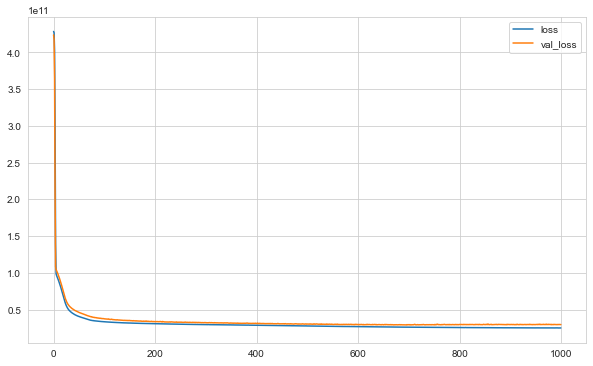

In [77]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot() 

# loss ve val_loss değerlerini çizdirdik. burada değerler hep yakın gitmiş. 
# burada bir overfitting yok. burda 100 epoch a gerek yokmuş aslında. 130-150 arasında bitebilirmiş.

In [78]:
model.evaluate(X_test, y_test, verbose=0) 

# model kendini test değerlerle değerlendiriyor. ama bu bizim anlamlandırabileceğimiz bir rakam değil.
# bizim için önemli rakam burada eval metrikteki değerlendirmeler.

22379917312.0

In [79]:
y_pred = model.predict(X_test)

68/68 [==============================] - 0s 932us/step


In [80]:
eval_metric(y_test, y_pred)

# eval metrik değerine göre de R2 skoru önemli. burda onu da değerlendirmek gerekiyor.
# burada 0.879 olarak hesaplanmis. 

r2_score: 0.8258097705866402 
mae: 93609.91070963541 
mse: 22379919206.80517 
rmse: 149599.1952077456


### learning_rate


Makine öğrenimi ve istatistikte, öğrenme oranı, minimum kayıp fonksiyonuna doğru hareket ederken her yinelemede adım boyutunu belirleyen bir optimizasyon algoritmasındaki bir ayar parametresidir.[1] Yeni edinilen bilgilerin eski bilgileri ne ölçüde geçersiz kıldığını etkilediğinden, bir makine öğrenme modelinin "öğrendiği" hızı mecazi olarak temsil eder. Uyarlanabilir kontrol literatüründe, öğrenme oranı yaygın olarak kazanç olarak adlandırılır.[2]

Bir öğrenme oranı belirlenirken, yakınsama ve aşma oranı arasında bir denge vardır. İniş yönü genellikle kayıp fonksiyonunun gradyanından belirlenirken, öğrenme oranı o yönde ne kadar büyük bir adım atılacağını belirler. Çok yüksek bir öğrenme oranı, öğrenmenin minimumları aşmasına neden olacaktır, ancak çok düşük bir öğrenme hızının yakınsaması ya çok uzun sürecek ya da istenmeyen bir yerel minimumda sıkışıp kalacaktır.[3]

Daha hızlı yakınsama sağlamak, salınımları önlemek ve istenmeyen yerel minimumlara takılmak için, öğrenme oranı genellikle eğitim sırasında ya bir öğrenme hızı çizelgesine göre ya da uyarlanabilir bir öğrenme hızı kullanılarak değiştirilir.[4] Öğrenme hızı ve ayarlamaları da parametreye göre farklılık gösterebilir, bu durumda bu köşegen bir matristir ve Newton'un yöntemindeki Hessian matrisinin tersine bir yaklaşım olarak yorumlanabilir.[5] Öğrenme oranı, Newton benzeri yöntemlerde ve ilgili optimizasyon algoritmalarında kesin olmayan satır araması tarafından belirlenen adım uzunluğu ile ilgilidir.[6]][7]

Hat aramaları yapılırken, mini toplu alt örnekleme (MBSS), öğrenme oranının çözülmesi gereken kayıp fonksiyonunun özelliklerini etkiler.[8] Statik MBSS, mini grubu bir arama yönü boyunca sabit tutarak arama yönü boyunca sorunsuz bir kayıp işlevi sağlar. Dinamik MBSS, mini grubu her işlev değerlendirmesinde günceller ve arama yönü boyunca noktasal süreksiz bir kayıp işleviyle sonuçlanır. Statik MBSS kayıp işlevleri için öğrenme oranlarını uyarlamalı olarak çözen satır aramaları, parabolik yaklaşım hattı (PAL) aramasını içerir.[9] Dinamik MBSS kayıp işlevleri için öğrenme oranlarını uyarlamalı olarak çözen satır aramaları, olasılıklı satır aramalarını,[10] yalnızca gradyan satır aramalarını (GOLS)[11] ve ikinci dereceden yaklaşımları içerir.[12]

In [82]:
from tensorflow.keras.optimizers import Adam

In [83]:
tf.random.set_seed(seed)

model = Sequential()  # bir dağdan inerken küçük adımlarla mı büyük adımlar mı ineceğiz? biz buna kendimiz karar verebiliyoruz.

model.add(Dense(29, activation = 'relu'))
model.add(Dense(29, activation = 'relu'))
model.add(Dense(15, activation = 'relu'))
model.add(Dense(8,  activation = 'relu'))
model.add(Dense(1))

opt = Adam(lr = 0.003) # default learning rate value is 0.001. 
# burada learning rate vermek için datalarımızı verdik. "adam"in icinde learning rate verildi.

model.compile(optimizer = opt, loss = 'mse') # genelde büyük datalarda learning rate değiştirilir.

In [84]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000)

# yukarıdaki gibi, learning rate i degistirerek modeli fit ettik.

Epoch 1/1000
130/130 [==============================] - 1s 3ms/step - loss: 427661656064.0000 - val_loss: 416649740288.0000
Epoch 2/1000
130/130 [==============================] - 0s 2ms/step - loss: 319551111168.0000 - val_loss: 137261023232.0000
Epoch 3/1000
130/130 [==============================] - 0s 2ms/step - loss: 100749844480.0000 - val_loss: 102673891328.0000
Epoch 4/1000
130/130 [==============================] - 0s 2ms/step - loss: 92902465536.0000 - val_loss: 98028756992.0000
Epoch 5/1000
130/130 [==============================] - 0s 2ms/step - loss: 87980228608.0000 - val_loss: 93115506688.0000
Epoch 6/1000
130/130 [==============================] - 0s 2ms/step - loss: 82774196224.0000 - val_loss: 87671963648.0000
Epoch 7/1000
130/130 [==============================] - 0s 2ms/step - loss: 77297074176.0000 - val_loss: 82327609344.0000
Epoch 8/1000
130/130 [==============================] - 0s 2ms/step - loss: 71583277056.0000 - val_loss: 76350357504.0000
Epoch 9/1000
130/1

130/130 [==============================] - 0s 2ms/step - loss: 31395424256.0000 - val_loss: 34246328320.0000
Epoch 68/1000
130/130 [==============================] - 0s 2ms/step - loss: 31231528960.0000 - val_loss: 34444304384.0000
Epoch 69/1000
130/130 [==============================] - 0s 2ms/step - loss: 31261894656.0000 - val_loss: 34278420480.0000
Epoch 70/1000
130/130 [==============================] - 0s 2ms/step - loss: 31168235520.0000 - val_loss: 34031708160.0000
Epoch 71/1000
130/130 [==============================] - 0s 2ms/step - loss: 31285489664.0000 - val_loss: 34367643648.0000
Epoch 72/1000
130/130 [==============================] - 0s 2ms/step - loss: 31067760640.0000 - val_loss: 33844721664.0000
Epoch 73/1000
130/130 [==============================] - 0s 2ms/step - loss: 31029000192.0000 - val_loss: 33893763072.0000
Epoch 74/1000
130/130 [==============================] - 0s 2ms/step - loss: 30989336576.0000 - val_loss: 33939812352.0000
Epoch 75/1000
130/130 [=======

130/130 [==============================] - 0s 2ms/step - loss: 29337251840.0000 - val_loss: 31717232640.0000
Epoch 134/1000
130/130 [==============================] - 0s 2ms/step - loss: 29351890944.0000 - val_loss: 31668643840.0000
Epoch 135/1000
130/130 [==============================] - 0s 2ms/step - loss: 29272178688.0000 - val_loss: 31604152320.0000
Epoch 136/1000
130/130 [==============================] - 0s 2ms/step - loss: 29223239680.0000 - val_loss: 31486001152.0000
Epoch 137/1000
130/130 [==============================] - 0s 2ms/step - loss: 29192908800.0000 - val_loss: 31550058496.0000
Epoch 138/1000
130/130 [==============================] - 0s 2ms/step - loss: 29130297344.0000 - val_loss: 32059269120.0000
Epoch 139/1000
130/130 [==============================] - 0s 2ms/step - loss: 29216815104.0000 - val_loss: 31689379840.0000
Epoch 140/1000
130/130 [==============================] - 0s 2ms/step - loss: 29098862592.0000 - val_loss: 31677827072.0000
Epoch 141/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 28022222848.0000 - val_loss: 30524020736.0000
Epoch 200/1000
130/130 [==============================] - 0s 2ms/step - loss: 27961436160.0000 - val_loss: 30315493376.0000
Epoch 201/1000
130/130 [==============================] - 0s 2ms/step - loss: 27912663040.0000 - val_loss: 31102849024.0000
Epoch 202/1000
130/130 [==============================] - 0s 2ms/step - loss: 27870373888.0000 - val_loss: 30899429376.0000
Epoch 203/1000
130/130 [==============================] - 0s 2ms/step - loss: 27809992704.0000 - val_loss: 30262648832.0000
Epoch 204/1000
130/130 [==============================] - 0s 2ms/step - loss: 27800035328.0000 - val_loss: 30835945472.0000
Epoch 205/1000
130/130 [==============================] - 0s 2ms/step - loss: 27823587328.0000 - val_loss: 30422319104.0000
Epoch 206/1000
130/130 [==============================] - 0s 2ms/step - loss: 27797929984.0000 - val_loss: 30493663232.0000
Epoch 207/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 26564673536.0000 - val_loss: 29270753280.0000
Epoch 266/1000
130/130 [==============================] - 0s 2ms/step - loss: 26546636800.0000 - val_loss: 29203261440.0000
Epoch 267/1000
130/130 [==============================] - 0s 2ms/step - loss: 26561566720.0000 - val_loss: 29044369408.0000
Epoch 268/1000
130/130 [==============================] - 0s 2ms/step - loss: 26500298752.0000 - val_loss: 28933863424.0000
Epoch 269/1000
130/130 [==============================] - 0s 2ms/step - loss: 26455287808.0000 - val_loss: 29581146112.0000
Epoch 270/1000
130/130 [==============================] - 0s 2ms/step - loss: 26548291584.0000 - val_loss: 29195853824.0000
Epoch 271/1000
130/130 [==============================] - 0s 2ms/step - loss: 26423117824.0000 - val_loss: 28973563904.0000
Epoch 272/1000
130/130 [==============================] - 0s 2ms/step - loss: 26526951424.0000 - val_loss: 29365291008.0000
Epoch 273/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 25698916352.0000 - val_loss: 29240147968.0000
Epoch 332/1000
130/130 [==============================] - 0s 1ms/step - loss: 25645019136.0000 - val_loss: 28817885184.0000
Epoch 333/1000
130/130 [==============================] - 0s 2ms/step - loss: 25551104000.0000 - val_loss: 29180080128.0000
Epoch 334/1000
130/130 [==============================] - 0s 2ms/step - loss: 25614331904.0000 - val_loss: 29305040896.0000
Epoch 335/1000
130/130 [==============================] - 0s 2ms/step - loss: 25557071872.0000 - val_loss: 29229010944.0000
Epoch 336/1000
130/130 [==============================] - 0s 2ms/step - loss: 25562740736.0000 - val_loss: 28752783360.0000
Epoch 337/1000
130/130 [==============================] - 0s 2ms/step - loss: 25571244032.0000 - val_loss: 29170688000.0000
Epoch 338/1000
130/130 [==============================] - 0s 2ms/step - loss: 25514397696.0000 - val_loss: 29139755008.0000
Epoch 339/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 25010120704.0000 - val_loss: 29886853120.0000
Epoch 398/1000
130/130 [==============================] - 0s 2ms/step - loss: 25063297024.0000 - val_loss: 29250555904.0000
Epoch 399/1000
130/130 [==============================] - 0s 2ms/step - loss: 25056974848.0000 - val_loss: 30316750848.0000
Epoch 400/1000
130/130 [==============================] - 0s 2ms/step - loss: 25147207680.0000 - val_loss: 29450319872.0000
Epoch 401/1000
130/130 [==============================] - 0s 2ms/step - loss: 25080776704.0000 - val_loss: 29208150016.0000
Epoch 402/1000
130/130 [==============================] - 0s 2ms/step - loss: 25041104896.0000 - val_loss: 29364606976.0000
Epoch 403/1000
130/130 [==============================] - 0s 1ms/step - loss: 24964319232.0000 - val_loss: 29695254528.0000
Epoch 404/1000
130/130 [==============================] - 0s 2ms/step - loss: 25062152192.0000 - val_loss: 29241292800.0000
Epoch 405/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 24586557440.0000 - val_loss: 29629571072.0000
Epoch 464/1000
130/130 [==============================] - 0s 2ms/step - loss: 24560345088.0000 - val_loss: 29750441984.0000
Epoch 465/1000
130/130 [==============================] - 0s 2ms/step - loss: 24489234432.0000 - val_loss: 30028748800.0000
Epoch 466/1000
130/130 [==============================] - 0s 2ms/step - loss: 24561956864.0000 - val_loss: 29703393280.0000
Epoch 467/1000
130/130 [==============================] - 0s 2ms/step - loss: 24554477568.0000 - val_loss: 29711681536.0000
Epoch 468/1000
130/130 [==============================] - 0s 2ms/step - loss: 24507142144.0000 - val_loss: 29884958720.0000
Epoch 469/1000
130/130 [==============================] - 0s 2ms/step - loss: 24565123072.0000 - val_loss: 29791375360.0000
Epoch 470/1000
130/130 [==============================] - 0s 2ms/step - loss: 24501923840.0000 - val_loss: 30084802560.0000
Epoch 471/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 24131551232.0000 - val_loss: 30333128704.0000
Epoch 530/1000
130/130 [==============================] - 0s 2ms/step - loss: 24134336512.0000 - val_loss: 30732566528.0000
Epoch 531/1000
130/130 [==============================] - 0s 2ms/step - loss: 24098226176.0000 - val_loss: 30454661120.0000
Epoch 532/1000
130/130 [==============================] - 0s 2ms/step - loss: 24079685632.0000 - val_loss: 30573602816.0000
Epoch 533/1000
130/130 [==============================] - 0s 2ms/step - loss: 24123160576.0000 - val_loss: 30210545664.0000
Epoch 534/1000
130/130 [==============================] - 0s 2ms/step - loss: 24078118912.0000 - val_loss: 30311444480.0000
Epoch 535/1000
130/130 [==============================] - 0s 2ms/step - loss: 24079808512.0000 - val_loss: 30454747136.0000
Epoch 536/1000
130/130 [==============================] - 0s 2ms/step - loss: 24134088704.0000 - val_loss: 30444240896.0000
Epoch 537/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 23777411072.0000 - val_loss: 30397179904.0000
Epoch 596/1000
130/130 [==============================] - 0s 2ms/step - loss: 23753897984.0000 - val_loss: 31537184768.0000
Epoch 597/1000
130/130 [==============================] - 0s 2ms/step - loss: 23903510528.0000 - val_loss: 30776717312.0000
Epoch 598/1000
130/130 [==============================] - 0s 2ms/step - loss: 23851900928.0000 - val_loss: 30752962560.0000
Epoch 599/1000
130/130 [==============================] - 0s 2ms/step - loss: 23725422592.0000 - val_loss: 30914025472.0000
Epoch 600/1000
130/130 [==============================] - 0s 2ms/step - loss: 23772311552.0000 - val_loss: 30566410240.0000
Epoch 601/1000
130/130 [==============================] - 0s 2ms/step - loss: 23768432640.0000 - val_loss: 30495311872.0000
Epoch 602/1000
130/130 [==============================] - 0s 2ms/step - loss: 23781425152.0000 - val_loss: 30536433664.0000
Epoch 603/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 23544774656.0000 - val_loss: 30661529600.0000
Epoch 662/1000
130/130 [==============================] - 0s 2ms/step - loss: 23621058560.0000 - val_loss: 30498447360.0000
Epoch 663/1000
130/130 [==============================] - 0s 2ms/step - loss: 23492089856.0000 - val_loss: 30517442560.0000
Epoch 664/1000
130/130 [==============================] - 0s 2ms/step - loss: 23548823552.0000 - val_loss: 30547621888.0000
Epoch 665/1000
130/130 [==============================] - 0s 2ms/step - loss: 23627958272.0000 - val_loss: 30730127360.0000
Epoch 666/1000
130/130 [==============================] - 0s 2ms/step - loss: 23576846336.0000 - val_loss: 30787348480.0000
Epoch 667/1000
130/130 [==============================] - 0s 2ms/step - loss: 23561041920.0000 - val_loss: 30680616960.0000
Epoch 668/1000
130/130 [==============================] - 0s 2ms/step - loss: 23566905344.0000 - val_loss: 30632452096.0000
Epoch 669/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 23312771072.0000 - val_loss: 30731237376.0000
Epoch 728/1000
130/130 [==============================] - 0s 2ms/step - loss: 23379091456.0000 - val_loss: 30901542912.0000
Epoch 729/1000
130/130 [==============================] - 0s 1ms/step - loss: 23297284096.0000 - val_loss: 31903545344.0000
Epoch 730/1000
130/130 [==============================] - 0s 2ms/step - loss: 23329382400.0000 - val_loss: 31073456128.0000
Epoch 731/1000
130/130 [==============================] - 0s 1ms/step - loss: 23387224064.0000 - val_loss: 30641053696.0000
Epoch 732/1000
130/130 [==============================] - 0s 1ms/step - loss: 23392290816.0000 - val_loss: 30537445376.0000
Epoch 733/1000
130/130 [==============================] - 0s 1ms/step - loss: 23289274368.0000 - val_loss: 30899822592.0000
Epoch 734/1000
130/130 [==============================] - 0s 2ms/step - loss: 23341449216.0000 - val_loss: 30534936576.0000
Epoch 735/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 23178889216.0000 - val_loss: 31123642368.0000
Epoch 794/1000
130/130 [==============================] - 0s 2ms/step - loss: 23092049920.0000 - val_loss: 30659563520.0000
Epoch 795/1000
130/130 [==============================] - 0s 2ms/step - loss: 23057418240.0000 - val_loss: 30681577472.0000
Epoch 796/1000
130/130 [==============================] - 0s 2ms/step - loss: 23011284992.0000 - val_loss: 30601963520.0000
Epoch 797/1000
130/130 [==============================] - 0s 2ms/step - loss: 22997600256.0000 - val_loss: 30810333184.0000
Epoch 798/1000
130/130 [==============================] - 0s 2ms/step - loss: 23092375552.0000 - val_loss: 30529601536.0000
Epoch 799/1000
130/130 [==============================] - 0s 2ms/step - loss: 22949621760.0000 - val_loss: 31168141312.0000
Epoch 800/1000
130/130 [==============================] - 0s 2ms/step - loss: 22921693184.0000 - val_loss: 30472544256.0000
Epoch 801/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 18029289472.0000 - val_loss: 24678561792.0000
Epoch 860/1000
130/130 [==============================] - 0s 2ms/step - loss: 17919131648.0000 - val_loss: 24908625920.0000
Epoch 861/1000
130/130 [==============================] - 0s 2ms/step - loss: 17860675584.0000 - val_loss: 24856709120.0000
Epoch 862/1000
130/130 [==============================] - 0s 2ms/step - loss: 17743282176.0000 - val_loss: 25593274368.0000
Epoch 863/1000
130/130 [==============================] - 0s 2ms/step - loss: 17851408384.0000 - val_loss: 25109358592.0000
Epoch 864/1000
130/130 [==============================] - 0s 2ms/step - loss: 17642735616.0000 - val_loss: 24828631040.0000
Epoch 865/1000
130/130 [==============================] - 0s 2ms/step - loss: 17608218624.0000 - val_loss: 24577323008.0000
Epoch 866/1000
130/130 [==============================] - 0s 2ms/step - loss: 17529122816.0000 - val_loss: 24580712448.0000
Epoch 867/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 15859049472.0000 - val_loss: 22669113344.0000
Epoch 926/1000
130/130 [==============================] - 0s 1ms/step - loss: 15830248448.0000 - val_loss: 23010490368.0000
Epoch 927/1000
130/130 [==============================] - 0s 2ms/step - loss: 15856113664.0000 - val_loss: 22974930944.0000
Epoch 928/1000
130/130 [==============================] - 0s 2ms/step - loss: 15810442240.0000 - val_loss: 23487897600.0000
Epoch 929/1000
130/130 [==============================] - 0s 2ms/step - loss: 15776680960.0000 - val_loss: 22938159104.0000
Epoch 930/1000
130/130 [==============================] - 0s 2ms/step - loss: 15767738368.0000 - val_loss: 23437752320.0000
Epoch 931/1000
130/130 [==============================] - 0s 2ms/step - loss: 15730509824.0000 - val_loss: 22774241280.0000
Epoch 932/1000
130/130 [==============================] - 0s 2ms/step - loss: 15726585856.0000 - val_loss: 23521185792.0000
Epoch 933/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 14749791232.0000 - val_loss: 21608167424.0000
Epoch 992/1000
130/130 [==============================] - 0s 2ms/step - loss: 14709023744.0000 - val_loss: 21640175616.0000
Epoch 993/1000
130/130 [==============================] - 0s 2ms/step - loss: 14950451200.0000 - val_loss: 21650053120.0000
Epoch 994/1000
130/130 [==============================] - 0s 2ms/step - loss: 14693754880.0000 - val_loss: 22342596608.0000
Epoch 995/1000
130/130 [==============================] - 0s 3ms/step - loss: 14603629568.0000 - val_loss: 21951102976.0000
Epoch 996/1000
130/130 [==============================] - 0s 2ms/step - loss: 14623293440.0000 - val_loss: 21778604032.0000
Epoch 997/1000
130/130 [==============================] - 0s 2ms/step - loss: 14600937472.0000 - val_loss: 21648715776.0000
Epoch 998/1000
130/130 [==============================] - 0s 2ms/step - loss: 14610659328.0000 - val_loss: 22227957760.0000
Epoch 999/1000
130/130 

<AxesSubplot:>

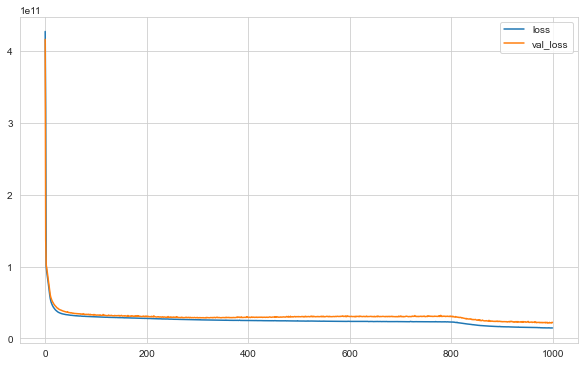

In [85]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot() 

# yine burda loss ve val_loss nasil degisiyor, gördük.

In [86]:
y_pred = model.predict(X_test)

68/68 [==============================] - 0s 1ms/step


In [87]:
eval_metric(y_test, y_pred) 

# burda müsteriye başarı olarak söyleyebileceğimiz şey %87 lik başarı elde ettik diyeceğiz.
# mse deki yüksek değerleri değerlendirmek manalı ve anlamlı bir açıklama yapmayı engeller. 
# R2 score u büyük ve 1 e yakın olmali.
# Diğer 3 değer mae, mse ve rmse düşük olmalı ki sonuçlar anlamlı olsun.

r2_score: 0.8697694548009546 
mae: 78159.33071108218 
mse: 16731989444.117975 
rmse: 129352.19149329468


### EarlyStopping

In [88]:
from tensorflow.keras.callbacks import EarlyStopping

In [89]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(29, activation = 'relu'))
model.add(Dense(29, activation = 'relu'))
model.add(Dense(15, activation = 'relu'))
model.add(Dense(8, activation = 'relu'))
model.add(Dense(1))

opt = Adam(lr = 0.003)
model.compile(optimizer = opt, loss = 'mse')

In [90]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "auto", verbose = 1, patience = 25)

# Patience, sabır demek. patience=25 diyerek, 25 epoch kadar sabret diyoruz.
# Epoch sayısını fazla vermek her ne kadar iyi gibi gözükse de, belli bir aşamadan sonra overfitting e de sebep oluyor.
# Bu sorunu çözmek için de mükemmel bir algoritma seçilmiş.
# belli bir adımdan sonra istediğimiz score(val_loss) fazla değişmiyorsa, mesela 25 epoch kendini tekrar ettiyse.
# ama yine de learning rate değişmedi ise, o zaman diyoruz ki artık dur ve diğer epochları yapma.
# bu early stopping küçük datalarda 20-25, büyük datalarda ise 5-10 civarında verilir.
# BU İŞLEM KÜÇÜK DATALARDA MANTIKLI İKEN ÇOK BÜYÜK (MESELA MİLYONLUK DATALARDA) ÇOK MANTIKLI DEĞİL.
# ÇÜNKÜ DAHA SONRASINDA VAL_LOSS İLE LOSS DEĞERLERİ TEKRAR BİRLEŞEBİLİYOR. 
# O YÜZDEN ÇOK BÜYÜK DATALARDA EARLY STOPPING TAVSİYE EDİLMEZ.

In [91]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000, callbacks = [early_stop]) 


Epoch 1/1000
130/130 [==============================] - 1s 2ms/step - loss: 425145499648.0000 - val_loss: 398111145984.0000
Epoch 2/1000
130/130 [==============================] - 0s 2ms/step - loss: 224012435456.0000 - val_loss: 105045041152.0000
Epoch 3/1000
130/130 [==============================] - 0s 2ms/step - loss: 95001534464.0000 - val_loss: 99663110144.0000
Epoch 4/1000
130/130 [==============================] - 0s 2ms/step - loss: 89477488640.0000 - val_loss: 94256914432.0000
Epoch 5/1000
130/130 [==============================] - 0s 2ms/step - loss: 83662856192.0000 - val_loss: 88282415104.0000
Epoch 6/1000
130/130 [==============================] - 0s 2ms/step - loss: 77343440896.0000 - val_loss: 81562730496.0000
Epoch 7/1000
130/130 [==============================] - 0s 2ms/step - loss: 70528901120.0000 - val_loss: 74713169920.0000
Epoch 8/1000
130/130 [==============================] - 0s 2ms/step - loss: 63651311616.0000 - val_loss: 67853205504.0000
Epoch 9/1000
130/130

130/130 [==============================] - 0s 2ms/step - loss: 30669287424.0000 - val_loss: 33119041536.0000
Epoch 68/1000
130/130 [==============================] - 0s 2ms/step - loss: 30504845312.0000 - val_loss: 33417891840.0000
Epoch 69/1000
130/130 [==============================] - 0s 1ms/step - loss: 30558812160.0000 - val_loss: 33116719104.0000
Epoch 70/1000
130/130 [==============================] - 0s 1ms/step - loss: 30454310912.0000 - val_loss: 32881563648.0000
Epoch 71/1000
130/130 [==============================] - 0s 2ms/step - loss: 30581735424.0000 - val_loss: 33166688256.0000
Epoch 72/1000
130/130 [==============================] - 0s 2ms/step - loss: 30366535680.0000 - val_loss: 32732725248.0000
Epoch 73/1000
130/130 [==============================] - 0s 2ms/step - loss: 30326061056.0000 - val_loss: 32825364480.0000
Epoch 74/1000
130/130 [==============================] - 0s 2ms/step - loss: 30279956480.0000 - val_loss: 32963178496.0000
Epoch 75/1000
130/130 [=======

130/130 [==============================] - 0s 2ms/step - loss: 28758620160.0000 - val_loss: 30812524544.0000
Epoch 134/1000
130/130 [==============================] - 0s 2ms/step - loss: 28753821696.0000 - val_loss: 30759454720.0000
Epoch 135/1000
130/130 [==============================] - 0s 2ms/step - loss: 28664676352.0000 - val_loss: 30679982080.0000
Epoch 136/1000
130/130 [==============================] - 0s 2ms/step - loss: 28621981696.0000 - val_loss: 30508331008.0000
Epoch 137/1000
130/130 [==============================] - 0s 2ms/step - loss: 28566296576.0000 - val_loss: 30584451072.0000
Epoch 138/1000
130/130 [==============================] - 0s 2ms/step - loss: 28486166528.0000 - val_loss: 31245367296.0000
Epoch 139/1000
130/130 [==============================] - 0s 2ms/step - loss: 28580143104.0000 - val_loss: 30770087936.0000
Epoch 140/1000
130/130 [==============================] - 0s 2ms/step - loss: 28438245376.0000 - val_loss: 30787860480.0000
Epoch 141/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 26269790208.0000 - val_loss: 28980451328.0000
Epoch 200/1000
130/130 [==============================] - 0s 2ms/step - loss: 26148427776.0000 - val_loss: 28757313536.0000
Epoch 201/1000
130/130 [==============================] - 0s 2ms/step - loss: 26045831168.0000 - val_loss: 29609568256.0000
Epoch 202/1000
130/130 [==============================] - 0s 2ms/step - loss: 26049818624.0000 - val_loss: 29486768128.0000
Epoch 203/1000
130/130 [==============================] - 0s 2ms/step - loss: 25973569536.0000 - val_loss: 28756744192.0000
Epoch 204/1000
130/130 [==============================] - 0s 2ms/step - loss: 25952749568.0000 - val_loss: 29284739072.0000
Epoch 205/1000
130/130 [==============================] - 0s 2ms/step - loss: 25973334016.0000 - val_loss: 28777437184.0000
Epoch 206/1000
130/130 [==============================] - 0s 2ms/step - loss: 25898891264.0000 - val_loss: 28817072128.0000
Epoch 207/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 23732699136.0000 - val_loss: 27552212992.0000
Epoch 266/1000
130/130 [==============================] - 0s 2ms/step - loss: 23692603392.0000 - val_loss: 27371872256.0000
Epoch 267/1000
130/130 [==============================] - 0s 2ms/step - loss: 23653091328.0000 - val_loss: 27324504064.0000
Epoch 268/1000
130/130 [==============================] - 0s 2ms/step - loss: 23519453184.0000 - val_loss: 27242573824.0000
Epoch 269/1000
130/130 [==============================] - 0s 2ms/step - loss: 23421116416.0000 - val_loss: 28179124224.0000
Epoch 270/1000
130/130 [==============================] - 0s 2ms/step - loss: 23499704320.0000 - val_loss: 27324051456.0000
Epoch 271/1000
130/130 [==============================] - 0s 3ms/step - loss: 23325452288.0000 - val_loss: 27256877056.0000
Epoch 272/1000
130/130 [==============================] - 0s 3ms/step - loss: 23364044800.0000 - val_loss: 27454046208.0000
Epoch 273/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 18161889280.0000 - val_loss: 24370706432.0000
Epoch 332/1000
130/130 [==============================] - 0s 2ms/step - loss: 18015995904.0000 - val_loss: 24120379392.0000
Epoch 333/1000
130/130 [==============================] - 0s 2ms/step - loss: 17920124928.0000 - val_loss: 23776946176.0000
Epoch 334/1000
130/130 [==============================] - 0s 2ms/step - loss: 17935300608.0000 - val_loss: 24220710912.0000
Epoch 335/1000
130/130 [==============================] - 0s 2ms/step - loss: 17867298816.0000 - val_loss: 23850592256.0000
Epoch 336/1000
130/130 [==============================] - 0s 2ms/step - loss: 17836679168.0000 - val_loss: 23374325760.0000
Epoch 337/1000
130/130 [==============================] - 0s 2ms/step - loss: 17893124096.0000 - val_loss: 23729838080.0000
Epoch 338/1000
130/130 [==============================] - 0s 2ms/step - loss: 17769570304.0000 - val_loss: 23749462016.0000
Epoch 339/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 16248640512.0000 - val_loss: 23504711680.0000
Epoch 398/1000
130/130 [==============================] - 0s 2ms/step - loss: 16189792256.0000 - val_loss: 23149072384.0000
Epoch 399/1000
130/130 [==============================] - 0s 2ms/step - loss: 16299223040.0000 - val_loss: 23140401152.0000
Epoch 400/1000
130/130 [==============================] - 0s 2ms/step - loss: 16279137280.0000 - val_loss: 22944067584.0000
Epoch 401/1000
130/130 [==============================] - 0s 2ms/step - loss: 16298516480.0000 - val_loss: 22815148032.0000
Epoch 402/1000
130/130 [==============================] - 0s 2ms/step - loss: 16152834048.0000 - val_loss: 22811783168.0000
Epoch 403/1000
130/130 [==============================] - 0s 2ms/step - loss: 16100574208.0000 - val_loss: 23718043648.0000
Epoch 404/1000
130/130 [==============================] - 0s 2ms/step - loss: 16125404160.0000 - val_loss: 23012786176.0000
Epoch 405/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 15146402816.0000 - val_loss: 22598090752.0000
Epoch 464/1000
130/130 [==============================] - 0s 2ms/step - loss: 15065210880.0000 - val_loss: 22855266304.0000
Epoch 465/1000
130/130 [==============================] - 0s 2ms/step - loss: 15040075776.0000 - val_loss: 23207727104.0000
Epoch 466/1000
130/130 [==============================] - 0s 2ms/step - loss: 15093972992.0000 - val_loss: 22724323328.0000
Epoch 467/1000
130/130 [==============================] - 0s 2ms/step - loss: 15049818112.0000 - val_loss: 22734166016.0000
Epoch 468/1000
130/130 [==============================] - 0s 2ms/step - loss: 15010813952.0000 - val_loss: 23330744320.0000
Epoch 469/1000
130/130 [==============================] - 0s 2ms/step - loss: 15150572544.0000 - val_loss: 22407960576.0000
Epoch 470/1000
130/130 [==============================] - 0s 2ms/step - loss: 14961377280.0000 - val_loss: 22998732800.0000
Epoch 471/1000
130/130 

<AxesSubplot:>

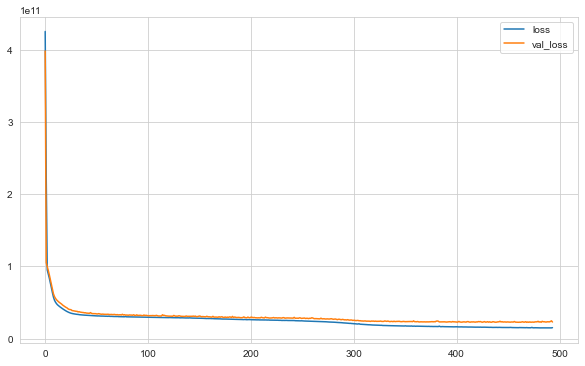

In [92]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot() 

# buradaki grafikte görülüyor ki, sonlara doğru epochlarda loss ile val_loss arasında hafif bir değişim var.
# yani overfitting e giden bir taraf var gibi. 
# burada bunu çözmenin yolu, early stopping. loss ve vall loss birbirinden ayrılmaya başladığında over fitting olmaya başlıyor.
# grafiği öyle yorumla. bunlar yan yana gitsin istiyoruz.
# ayrılınca modelimiz bozuluyor anlamına geliyor. uyumsuzlaştığı noktada modeli kesmemiz lazım.
# burda da early stopping devreye giriyor.
# burada ayrışma küçük gibi gözüküyor ama sayısal değerle incelenirse ciddi bir uzaklaşma var.
# grafikteki sayılar çok büyük olduğundan, sanki çok yakınlarmis gibi görünüyor.
# burda val_loss düşsün diye bekliyoruz. düşmesi iyi bizim için.

In [93]:
y_pred = model.predict(X_test)


68/68 [==============================] - 0s 943us/step


In [94]:
eval_metric(y_test, y_pred) 

# BURADA SCORE DÜŞTÜ. ÇÜNKÜ EARLY STOPPING ERKEN GERÇEKLEŞTİ. 
# DATA KÜÇÜK OLMASINA RAĞMEN, DEMEK Kİ DAHA SONRASINDAKİ EPOCHLARDA DAHA İYİ ÖĞRENME GERÇEKLEŞMİŞ.
# TENSOR FLOW UN FARKLI VERSİYONLARINDA FARKLI ÇIKIYOR.

r2_score: 0.8644594507894827 
mae: 76845.57744773582 
mse: 17414217495.397175 
rmse: 131962.93985584428


### Dropout

The Dropout layer randomly sets input units to 0 with a frequency of `rate`
at each step during training time, which helps prevent overfitting.

In [95]:
from tensorflow.keras.layers import Dropout

In [96]:
tf.random.set_seed(seed)

model = Sequential()       

# dropout da nöronların kaçta kaçını söndürerek overfitting ile mücadele edeceğimize karar veriyoruz.
# burada katmanların layer ların arasına dropout girmiş. 0.2 yani %20.
# layer lar arasındaki 29 nöronun %20 si, yani 4 tane nöronu her seferinde random seçerek söndürerek işlem yapacak.
# BÜYÜK DATALARDA DROP OUT YAPMAK TAVSİYE EDİLİR.

model.add(Dense(29, activation = 'relu'))
model.add(Dropout(0.2))
model.add(Dense(29, activation = 'relu'))
model.add(Dropout(0.2))
model.add(Dense(15, activation = 'relu'))
model.add(Dropout(0.2))
model.add(Dense(8, activation = 'relu'))
model.add(Dropout(0.2))
model.add(Dense(1))

opt = Adam(lr = 0.003) # learning rate yine değiştirildi
model.compile(optimizer = opt, loss = 'mse')

In [97]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "auto", verbose = 1, patience = 25)

# yine early stopping yaptık.

In [98]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000, callbacks = [early_stop])

# early stopping için 240 da durdu. bir öncekine göre daha erken durdu.

Epoch 1/1000
130/130 [==============================] - 1s 3ms/step - loss: 424102658048.0000 - val_loss: 388754505728.0000
Epoch 2/1000
130/130 [==============================] - 0s 2ms/step - loss: 215082811392.0000 - val_loss: 108340264960.0000
Epoch 3/1000
130/130 [==============================] - 0s 2ms/step - loss: 128898351104.0000 - val_loss: 101476655104.0000
Epoch 4/1000
130/130 [==============================] - 0s 2ms/step - loss: 118280101888.0000 - val_loss: 93729398784.0000
Epoch 5/1000
130/130 [==============================] - 0s 2ms/step - loss: 113529143296.0000 - val_loss: 86842384384.0000
Epoch 6/1000
130/130 [==============================] - 0s 2ms/step - loss: 106397114368.0000 - val_loss: 79350161408.0000
Epoch 7/1000
130/130 [==============================] - 0s 2ms/step - loss: 99563536384.0000 - val_loss: 70035529728.0000
Epoch 8/1000
130/130 [==============================] - 0s 2ms/step - loss: 92427583488.0000 - val_loss: 64560750592.0000
Epoch 9/1000
13

130/130 [==============================] - 0s 2ms/step - loss: 66078445568.0000 - val_loss: 37081354240.0000
Epoch 68/1000
130/130 [==============================] - 0s 2ms/step - loss: 67005554688.0000 - val_loss: 37524000768.0000
Epoch 69/1000
130/130 [==============================] - 0s 2ms/step - loss: 67050201088.0000 - val_loss: 36344934400.0000
Epoch 70/1000
130/130 [==============================] - 0s 2ms/step - loss: 69602271232.0000 - val_loss: 36653023232.0000
Epoch 71/1000
130/130 [==============================] - 0s 2ms/step - loss: 67193880576.0000 - val_loss: 35953270784.0000
Epoch 72/1000
130/130 [==============================] - 0s 2ms/step - loss: 67027767296.0000 - val_loss: 36842221568.0000
Epoch 73/1000
130/130 [==============================] - 0s 2ms/step - loss: 66346123264.0000 - val_loss: 37002317824.0000
Epoch 74/1000
130/130 [==============================] - 0s 2ms/step - loss: 66325430272.0000 - val_loss: 37385220096.0000
Epoch 75/1000
130/130 [=======

130/130 [==============================] - 0s 2ms/step - loss: 64178700288.0000 - val_loss: 34092445696.0000
Epoch 134/1000
130/130 [==============================] - 0s 2ms/step - loss: 63714172928.0000 - val_loss: 34440130560.0000
Epoch 135/1000
130/130 [==============================] - 0s 2ms/step - loss: 64248086528.0000 - val_loss: 34711031808.0000
Epoch 136/1000
130/130 [==============================] - 0s 2ms/step - loss: 69848932352.0000 - val_loss: 34892312576.0000
Epoch 137/1000
130/130 [==============================] - 0s 2ms/step - loss: 62243930112.0000 - val_loss: 34926948352.0000
Epoch 138/1000
130/130 [==============================] - 0s 2ms/step - loss: 66036789248.0000 - val_loss: 33171081216.0000
Epoch 139/1000
130/130 [==============================] - 0s 2ms/step - loss: 62453125120.0000 - val_loss: 34123927552.0000
Epoch 140/1000
130/130 [==============================] - 0s 2ms/step - loss: 65803599872.0000 - val_loss: 35938840576.0000
Epoch 141/1000
130/130 

<AxesSubplot:>

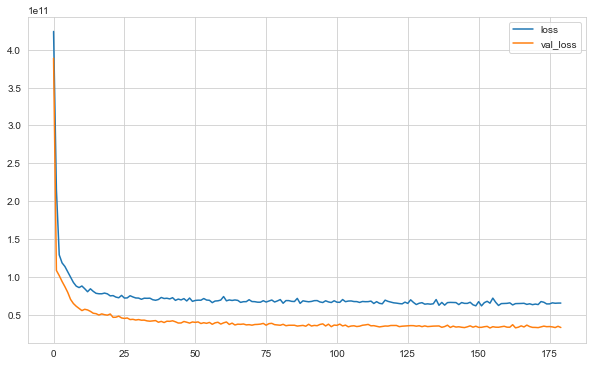

In [99]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [100]:
y_pred = model.predict(X_test)

68/68 [==============================] - 0s 1ms/step


In [101]:
eval_metric(y_test, y_pred) 

# sonuçlar düştü. burada başarılı bir sonuç elde edemedik.
# normalde overfitting e engel olmak istiyorduk. ama overfitting e sebep olduk.
# bunda datanın küçük olmasının ciddi bir etkisi var.

r2_score: 0.787813318577286 
mae: 102369.48987630209 
mse: 27261694315.423157 
rmse: 165111.1574528601


## Saving Final Model and Scaler

In [102]:
import pickle
pickle.dump(scaler, open("scaler_kc_house", 'wb'))

In [103]:
tf.random.set_seed(seed)
# MODELİ KAYDEDERKEN HANGI KODDA BAŞARILI OLDUYSAK, ONU BURDA ÇALIŞTIRIYORUZ.
# AYNI SONUÇLARI ALANA KADAR DA TEKRAR ÇALIŞTIRIP AYNI SONUCU ALIP KAYDEDİYORUZ.

model = Sequential()

model.add(Dense(29, activation = 'relu'))
model.add(Dense(29, activation = 'relu'))
model.add(Dense(15, activation = 'relu'))
model.add(Dense(8, activation = 'relu'))
model.add(Dense(1))

opt = Adam(lr = 0.003)
model.compile(optimizer = opt, loss = 'mse')

In [104]:
#early_stop = EarlyStopping(monitor = "val_loss", mode = "auto", verbose = 1, patience = 25)

In [106]:
model.fit(x = X_train, y = y_train, validation_data = (X_test, y_test), batch_size = 128, epochs = 1000,
         # callbacks = [early_stop] 
         )

Epoch 1/1000
152/152 [==============================] - 1s 2ms/step - loss: 419410608128.0000 - val_loss: 356302389248.0000
Epoch 2/1000
152/152 [==============================] - 0s 2ms/step - loss: 163913777152.0000 - val_loss: 90410467328.0000
Epoch 3/1000
152/152 [==============================] - 0s 2ms/step - loss: 93671096320.0000 - val_loss: 84018954240.0000
Epoch 4/1000
152/152 [==============================] - 0s 2ms/step - loss: 87033839616.0000 - val_loss: 77237862400.0000
Epoch 5/1000
152/152 [==============================] - 0s 2ms/step - loss: 79739101184.0000 - val_loss: 69575622656.0000
Epoch 6/1000
152/152 [==============================] - 0s 2ms/step - loss: 71720706048.0000 - val_loss: 61487366144.0000
Epoch 7/1000
152/152 [==============================] - 0s 2ms/step - loss: 63420481536.0000 - val_loss: 53819248640.0000
Epoch 8/1000
152/152 [==============================] - 0s 2ms/step - loss: 56525242368.0000 - val_loss: 48692912128.0000
Epoch 9/1000
152/152 

152/152 [==============================] - 0s 1ms/step - loss: 30358943744.0000 - val_loss: 26290825216.0000
Epoch 68/1000
152/152 [==============================] - 0s 2ms/step - loss: 30285674496.0000 - val_loss: 26281873408.0000
Epoch 69/1000
152/152 [==============================] - 0s 2ms/step - loss: 30185857024.0000 - val_loss: 26351992832.0000
Epoch 70/1000
152/152 [==============================] - 0s 1ms/step - loss: 30139748352.0000 - val_loss: 26185095168.0000
Epoch 71/1000
152/152 [==============================] - 0s 1ms/step - loss: 30190135296.0000 - val_loss: 26101579776.0000
Epoch 72/1000
152/152 [==============================] - 0s 1ms/step - loss: 30043052032.0000 - val_loss: 26168504320.0000
Epoch 73/1000
152/152 [==============================] - 0s 1ms/step - loss: 30126925824.0000 - val_loss: 26155100160.0000
Epoch 74/1000
152/152 [==============================] - 0s 2ms/step - loss: 30095435776.0000 - val_loss: 26065313792.0000
Epoch 75/1000
152/152 [=======

152/152 [==============================] - 0s 2ms/step - loss: 28015669248.0000 - val_loss: 23957764096.0000
Epoch 134/1000
152/152 [==============================] - 0s 2ms/step - loss: 27897473024.0000 - val_loss: 24174137344.0000
Epoch 135/1000
152/152 [==============================] - 0s 2ms/step - loss: 27924484096.0000 - val_loss: 24041000960.0000
Epoch 136/1000
152/152 [==============================] - 0s 2ms/step - loss: 27807713280.0000 - val_loss: 24429381632.0000
Epoch 137/1000
152/152 [==============================] - 0s 2ms/step - loss: 27959412736.0000 - val_loss: 23996712960.0000
Epoch 138/1000
152/152 [==============================] - 0s 2ms/step - loss: 27845154816.0000 - val_loss: 23918551040.0000
Epoch 139/1000
152/152 [==============================] - 0s 2ms/step - loss: 27729283072.0000 - val_loss: 23847108608.0000
Epoch 140/1000
152/152 [==============================] - 0s 2ms/step - loss: 27792793600.0000 - val_loss: 23766444032.0000
Epoch 141/1000
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 25901164544.0000 - val_loss: 22702981120.0000
Epoch 200/1000
152/152 [==============================] - 0s 2ms/step - loss: 25915668480.0000 - val_loss: 22662072320.0000
Epoch 201/1000
152/152 [==============================] - 0s 2ms/step - loss: 25957562368.0000 - val_loss: 22556364800.0000
Epoch 202/1000
152/152 [==============================] - 0s 2ms/step - loss: 25913878528.0000 - val_loss: 22554953728.0000
Epoch 203/1000
152/152 [==============================] - 0s 2ms/step - loss: 25903673344.0000 - val_loss: 22702319616.0000
Epoch 204/1000
152/152 [==============================] - 0s 2ms/step - loss: 25818054656.0000 - val_loss: 22611601408.0000
Epoch 205/1000
152/152 [==============================] - 0s 2ms/step - loss: 25827188736.0000 - val_loss: 22608439296.0000
Epoch 206/1000
152/152 [==============================] - 0s 2ms/step - loss: 25814183936.0000 - val_loss: 22521014272.0000
Epoch 207/1000
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 25056884736.0000 - val_loss: 22050979840.0000
Epoch 266/1000
152/152 [==============================] - 0s 2ms/step - loss: 25044234240.0000 - val_loss: 22369552384.0000
Epoch 267/1000
152/152 [==============================] - 0s 2ms/step - loss: 25114511360.0000 - val_loss: 22137882624.0000
Epoch 268/1000
152/152 [==============================] - 0s 2ms/step - loss: 25150523392.0000 - val_loss: 22072317952.0000
Epoch 269/1000
152/152 [==============================] - 0s 2ms/step - loss: 25171075072.0000 - val_loss: 22037680128.0000
Epoch 270/1000
152/152 [==============================] - 0s 2ms/step - loss: 25026246656.0000 - val_loss: 22060730368.0000
Epoch 271/1000
152/152 [==============================] - 0s 1ms/step - loss: 25099737088.0000 - val_loss: 22122196992.0000
Epoch 272/1000
152/152 [==============================] - 0s 2ms/step - loss: 24991166464.0000 - val_loss: 22951741440.0000
Epoch 273/1000
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 24537655296.0000 - val_loss: 22089418752.0000
Epoch 332/1000
152/152 [==============================] - 0s 2ms/step - loss: 24706103296.0000 - val_loss: 22299197440.0000
Epoch 333/1000
152/152 [==============================] - 0s 2ms/step - loss: 24584175616.0000 - val_loss: 22141280256.0000
Epoch 334/1000
152/152 [==============================] - 0s 2ms/step - loss: 24630554624.0000 - val_loss: 22108655616.0000
Epoch 335/1000
152/152 [==============================] - 0s 2ms/step - loss: 24658327552.0000 - val_loss: 22129539072.0000
Epoch 336/1000
152/152 [==============================] - 0s 1ms/step - loss: 24536008704.0000 - val_loss: 22189541376.0000
Epoch 337/1000
152/152 [==============================] - 0s 1ms/step - loss: 24665333760.0000 - val_loss: 22006716416.0000
Epoch 338/1000
152/152 [==============================] - 0s 2ms/step - loss: 24548227072.0000 - val_loss: 22067417088.0000
Epoch 339/1000
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 24318699520.0000 - val_loss: 22277566464.0000
Epoch 398/1000
152/152 [==============================] - 0s 2ms/step - loss: 24285550592.0000 - val_loss: 22348656640.0000
Epoch 399/1000
152/152 [==============================] - 0s 2ms/step - loss: 24308213760.0000 - val_loss: 22186606592.0000
Epoch 400/1000
152/152 [==============================] - 0s 2ms/step - loss: 24222339072.0000 - val_loss: 22290974720.0000
Epoch 401/1000
152/152 [==============================] - 0s 2ms/step - loss: 24258197504.0000 - val_loss: 22282407936.0000
Epoch 402/1000
152/152 [==============================] - 0s 2ms/step - loss: 24275910656.0000 - val_loss: 22739752960.0000
Epoch 403/1000
152/152 [==============================] - 0s 2ms/step - loss: 24292984832.0000 - val_loss: 22320719872.0000
Epoch 404/1000
152/152 [==============================] - 0s 2ms/step - loss: 24214558720.0000 - val_loss: 22194847744.0000
Epoch 405/1000
152/152 

152/152 [==============================] - 0s 1ms/step - loss: 23914035200.0000 - val_loss: 22506778624.0000
Epoch 464/1000
152/152 [==============================] - 0s 1ms/step - loss: 24017137664.0000 - val_loss: 22344595456.0000
Epoch 465/1000
152/152 [==============================] - 0s 1ms/step - loss: 23902298112.0000 - val_loss: 22459297792.0000
Epoch 466/1000
152/152 [==============================] - 0s 2ms/step - loss: 23941902336.0000 - val_loss: 22407229440.0000
Epoch 467/1000
152/152 [==============================] - 0s 1ms/step - loss: 23882133504.0000 - val_loss: 22372149248.0000
Epoch 468/1000
152/152 [==============================] - 0s 1ms/step - loss: 23898185728.0000 - val_loss: 22436687872.0000
Epoch 469/1000
152/152 [==============================] - 0s 1ms/step - loss: 23940472832.0000 - val_loss: 22307598336.0000
Epoch 470/1000
152/152 [==============================] - 0s 1ms/step - loss: 23873015808.0000 - val_loss: 22607366144.0000
Epoch 471/1000
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 21644265472.0000 - val_loss: 20455434240.0000
Epoch 530/1000
152/152 [==============================] - 0s 1ms/step - loss: 21629235200.0000 - val_loss: 20279920640.0000
Epoch 531/1000
152/152 [==============================] - 0s 1ms/step - loss: 21401509888.0000 - val_loss: 20043941888.0000
Epoch 532/1000
152/152 [==============================] - 0s 1ms/step - loss: 21230018560.0000 - val_loss: 20148668416.0000
Epoch 533/1000
152/152 [==============================] - 0s 2ms/step - loss: 21091405824.0000 - val_loss: 19880757248.0000
Epoch 534/1000
152/152 [==============================] - 0s 2ms/step - loss: 20968720384.0000 - val_loss: 19656198144.0000
Epoch 535/1000
152/152 [==============================] - 0s 1ms/step - loss: 20830160896.0000 - val_loss: 19591522304.0000
Epoch 536/1000
152/152 [==============================] - 0s 1ms/step - loss: 20723931136.0000 - val_loss: 19632746496.0000
Epoch 537/1000
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 16892997632.0000 - val_loss: 16160400384.0000
Epoch 596/1000
152/152 [==============================] - 0s 2ms/step - loss: 16903095296.0000 - val_loss: 16085977088.0000
Epoch 597/1000
152/152 [==============================] - 0s 2ms/step - loss: 16859428864.0000 - val_loss: 16187672576.0000
Epoch 598/1000
152/152 [==============================] - 0s 2ms/step - loss: 16897170432.0000 - val_loss: 16205134848.0000
Epoch 599/1000
152/152 [==============================] - 0s 2ms/step - loss: 16797630464.0000 - val_loss: 16110873600.0000
Epoch 600/1000
152/152 [==============================] - 0s 2ms/step - loss: 16787721216.0000 - val_loss: 15949712384.0000
Epoch 601/1000
152/152 [==============================] - 0s 2ms/step - loss: 16632228864.0000 - val_loss: 15963726848.0000
Epoch 602/1000
152/152 [==============================] - 0s 1ms/step - loss: 16641302528.0000 - val_loss: 16189029376.0000
Epoch 603/1000
152/152 

152/152 [==============================] - 0s 1ms/step - loss: 15275066368.0000 - val_loss: 15396962304.0000
Epoch 662/1000
152/152 [==============================] - 0s 2ms/step - loss: 15244284928.0000 - val_loss: 15511863296.0000
Epoch 663/1000
152/152 [==============================] - 0s 2ms/step - loss: 15161448448.0000 - val_loss: 15339173888.0000
Epoch 664/1000
152/152 [==============================] - 0s 2ms/step - loss: 15271482368.0000 - val_loss: 15431333888.0000
Epoch 665/1000
152/152 [==============================] - 0s 2ms/step - loss: 15132118016.0000 - val_loss: 15568074752.0000
Epoch 666/1000
152/152 [==============================] - 0s 2ms/step - loss: 15108507648.0000 - val_loss: 15460486144.0000
Epoch 667/1000
152/152 [==============================] - 0s 1ms/step - loss: 15103197184.0000 - val_loss: 15740832768.0000
Epoch 668/1000
152/152 [==============================] - 0s 1ms/step - loss: 15132827648.0000 - val_loss: 15613241344.0000
Epoch 669/1000
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 13943428096.0000 - val_loss: 14908057600.0000
Epoch 728/1000
152/152 [==============================] - 0s 2ms/step - loss: 13848850432.0000 - val_loss: 15175235584.0000
Epoch 729/1000
152/152 [==============================] - 0s 2ms/step - loss: 13935101952.0000 - val_loss: 14987366400.0000
Epoch 730/1000
152/152 [==============================] - 0s 1ms/step - loss: 13926014976.0000 - val_loss: 15066142720.0000
Epoch 731/1000
152/152 [==============================] - 0s 2ms/step - loss: 14048033792.0000 - val_loss: 15159891968.0000
Epoch 732/1000
152/152 [==============================] - 0s 1ms/step - loss: 13852037120.0000 - val_loss: 15156300800.0000
Epoch 733/1000
152/152 [==============================] - 0s 2ms/step - loss: 13892521984.0000 - val_loss: 15223374848.0000
Epoch 734/1000
152/152 [==============================] - 0s 2ms/step - loss: 13816138752.0000 - val_loss: 15069381632.0000
Epoch 735/1000
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 12708061184.0000 - val_loss: 14560885760.0000
Epoch 794/1000
152/152 [==============================] - 0s 1ms/step - loss: 12668302336.0000 - val_loss: 14386195456.0000
Epoch 795/1000
152/152 [==============================] - 0s 2ms/step - loss: 12685914112.0000 - val_loss: 14172638208.0000
Epoch 796/1000
152/152 [==============================] - 0s 2ms/step - loss: 12670049280.0000 - val_loss: 14330281984.0000
Epoch 797/1000
152/152 [==============================] - 0s 2ms/step - loss: 12742889472.0000 - val_loss: 14399234048.0000
Epoch 798/1000
152/152 [==============================] - 0s 2ms/step - loss: 12689529856.0000 - val_loss: 14992367616.0000
Epoch 799/1000
152/152 [==============================] - 0s 2ms/step - loss: 12685813760.0000 - val_loss: 14154352640.0000
Epoch 800/1000
152/152 [==============================] - 0s 2ms/step - loss: 12499270656.0000 - val_loss: 14066022400.0000
Epoch 801/1000
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 11850295296.0000 - val_loss: 14161380352.0000
Epoch 860/1000
152/152 [==============================] - 0s 2ms/step - loss: 11859034112.0000 - val_loss: 13802090496.0000
Epoch 861/1000
152/152 [==============================] - 0s 2ms/step - loss: 11599457280.0000 - val_loss: 13654832128.0000
Epoch 862/1000
152/152 [==============================] - 0s 1ms/step - loss: 11707855872.0000 - val_loss: 13861616640.0000
Epoch 863/1000
152/152 [==============================] - 0s 2ms/step - loss: 11778078720.0000 - val_loss: 13888359424.0000
Epoch 864/1000
152/152 [==============================] - 0s 2ms/step - loss: 11769611264.0000 - val_loss: 13956916224.0000
Epoch 865/1000
152/152 [==============================] - 0s 2ms/step - loss: 11809265664.0000 - val_loss: 13837335552.0000
Epoch 866/1000
152/152 [==============================] - 0s 2ms/step - loss: 11754307584.0000 - val_loss: 13841925120.0000
Epoch 867/1000
152/152 

152/152 [==============================] - 0s 1ms/step - loss: 11209371648.0000 - val_loss: 13379485696.0000
Epoch 926/1000
152/152 [==============================] - 0s 1ms/step - loss: 11159269376.0000 - val_loss: 13562392576.0000
Epoch 927/1000
152/152 [==============================] - 0s 1ms/step - loss: 11151399936.0000 - val_loss: 13774701568.0000
Epoch 928/1000
152/152 [==============================] - 0s 1ms/step - loss: 11191185408.0000 - val_loss: 13439894528.0000
Epoch 929/1000
152/152 [==============================] - 0s 1ms/step - loss: 11183417344.0000 - val_loss: 13566449664.0000
Epoch 930/1000
152/152 [==============================] - 0s 1ms/step - loss: 11126605824.0000 - val_loss: 13323759616.0000
Epoch 931/1000
152/152 [==============================] - 0s 1ms/step - loss: 11158882304.0000 - val_loss: 13345594368.0000
Epoch 932/1000
152/152 [==============================] - 0s 1ms/step - loss: 11131124736.0000 - val_loss: 14300752896.0000
Epoch 933/1000
152/152 

152/152 [==============================] - 0s 1ms/step - loss: 10782661632.0000 - val_loss: 13556611072.0000
Epoch 992/1000
152/152 [==============================] - 0s 1ms/step - loss: 10866096128.0000 - val_loss: 13272721408.0000
Epoch 993/1000
152/152 [==============================] - 0s 1ms/step - loss: 10794699776.0000 - val_loss: 13109559296.0000
Epoch 994/1000
152/152 [==============================] - 0s 1ms/step - loss: 10707841024.0000 - val_loss: 13322386432.0000
Epoch 995/1000
152/152 [==============================] - 0s 1ms/step - loss: 10768699392.0000 - val_loss: 13181845504.0000
Epoch 996/1000
152/152 [==============================] - 0s 1ms/step - loss: 10722069504.0000 - val_loss: 13138527232.0000
Epoch 997/1000
152/152 [==============================] - 0s 1ms/step - loss: 10737799168.0000 - val_loss: 13289376768.0000
Epoch 998/1000
152/152 [==============================] - 0s 1ms/step - loss: 10810593280.0000 - val_loss: 13107160064.0000
Epoch 999/1000
152/152 

<AxesSubplot:>

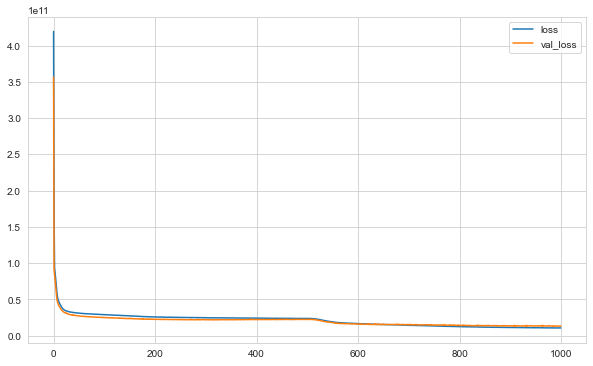

In [107]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [108]:
y_pred = model.predict(X_test)

68/68 [==============================] - 0s 982us/step


In [109]:
eval_metric(y_test, y_pred)

r2_score: 0.8955136019533559 
mae: 69350.0212890625 
mse: 13424387546.702616 
rmse: 115863.65930136427


In [110]:
model.save('model_kc_house.h5')  

# This creates a H5 file 'my_model.h5'
# MODELİ H5 UZANTILI DOSYA İLE KAYDEDİYORUZ

## Loading Model and Scaler

In [111]:
from tensorflow.keras.models import load_model  # ML de sonuçları da gördük

In [112]:
model_kc_house = load_model('model_kc_house.h5')
scaler_kc_house = pickle.load(open("scaler_kc_house", "rb"))

## Prediction

In [113]:
single_house = df.drop('price', axis = 1).iloc[0:1, :]
single_house

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
0,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,47.511,-122.257,1340,5650,0,0,0,0,0,0,0,0,0,1,0,0


In [114]:
single_house = scaler_kc_house.transform(single_house)
single_house

array([[ 3.00000e+00,  1.00000e+00,  1.18000e+03,  5.65000e+03,
         1.00000e+00,  0.00000e+00,  0.00000e+00,  3.00000e+00,
         7.00000e+00,  1.18000e+03,  0.00000e+00,  1.95500e+03,
         0.00000e+00,  4.75112e+01, -1.22257e+02,  1.34000e+03,
         5.65000e+03,  0.00000e+00,  0.00000e+00,  0.00000e+00,
         0.00000e+00,  0.00000e+00,  0.00000e+00,  0.00000e+00,
         0.00000e+00,  0.00000e+00,  1.00000e+00,  0.00000e+00,
         0.00000e+00]])

In [115]:
model_kc_house.predict(single_house)

1/1 [==============================] - 0s 59ms/step


array([[8.492112e+09]], dtype=float32)

In [116]:
df.iloc[0][0]

221900.0

## Comparison with ML

### Linear Regression

In [117]:
from sklearn.linear_model import LinearRegression 

In [118]:
ln_model = LinearRegression()
ln_model.fit(X_train, y_train)
y_pred = ln_model.predict(X_test)
eval_metric(y_test, y_pred)

r2_score: 0.7166899280297416 
mae: 122192.27592592593 
mse: 36399610601.13426 
rmse: 190786.81977834387


### Random Forest

In [119]:
from sklearn.ensemble import RandomForestRegressor

In [121]:
rf_model = RandomForestRegressor(random_state = seed)
rf_model.fit(X_train, y_train)
y_pred = rf_model.predict(X_test)
eval_metric(y_test, y_pred) 

# random forest daha iyi sonuç verdi. datanın küçük oldugunda Ml ile çalışmak daha mantıklı.
# DL büyük dataların adamı.

r2_score: 0.8886293030442941 
mae: 64785.36375462963 
mse: 14308880631.643038 
rmse: 119619.73345415479
